**Mounting Google Drive For the DataSet**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**Creating a New Folder named as Train,Inside that We will have the subfolders which are corresponding to vbar_categorical,hbar_categorical,line,pie,dot_line and inside that we will have the corresponding Image Data,we spilited like this with help of csv label given to us.**

In [ ]:
from __future__ import print_function
import pandas as pd
import shutil
import os
import sys

labels = pd.read_csv(r'/content/drive/MyDrive/charts/charts/train_val.csv')

train_dir =r'/content/drive/MyDrive/charts/charts/train_val'
DR = r"/content/drive/MyDrive/charts/charts/train"
if not os.path.exists(DR):
    os.mkdir(DR)
print(labels.values)
for filename, class_name in labels.values:
    # Create subdirectory with `class_name`
    if not os.path.exists(DR +"/"+ str(class_name)):
        os.mkdir(DR +"/"+ str(class_name))
    src_path = train_dir + '/'+ str(filename) + '.png'
    dst_path = DR +"/"+ str(class_name) + '/' + str(filename) + '.png'
    try:
        shutil.copy(src_path, dst_path)
        
    except IOError as e:
        print('Unable to copy file {} to {}'
              .format(src_path, dst_path))
    except:
        print('When try copy file {} to {}, unexpected error: {}'
              .format(src_path, dst_path, sys.exc_info()))

[[0 'vbar_categorical']
 [1 'vbar_categorical']
 [2 'vbar_categorical']
 ...
 [997 'dot_line']
 [998 'dot_line']
 [999 'dot_line']]


**Reading Csv Data set in Dataframe Format**

In [ ]:
data = pd.read_csv(r'/content/drive/MyDrive/charts/charts/train_val.csv')


**To Ensure the correct Spilitting Checking the Counts of the images inside Train folder**

In [ ]:
import os

# set path to parent folder
parent_folder = "/content/drive/MyDrive/charts/charts/train"

# iterate through subfolders and count number of images
for folder in os.listdir(parent_folder):
    folder_path = os.path.join(parent_folder, folder)
    if os.path.isdir(folder_path):
        num_images = len([filename for filename in os.listdir(folder_path) if filename.endswith(".png")])
        print("Folder {} contains {} images".format(folder, num_images))

Folder vbar_categorical contains 200 images
Folder hbar_categorical contains 200 images
Folder line contains 200 images
Folder pie contains 200 images
Folder dot_line contains 200 images


**Train Test Spilit-->As Mentioned in the Question Spilited the data into 80%-20%**

In [ ]:
import os
import shutil
import random

root_dir = '/content/drive/MyDrive/charts/charts/train'
train_dir = '/content/drive/MyDrive/charts/charts/train_split/train'
val_dir = '/content/drive/MyDrive/charts/charts/train_split/val'

# Create the train and val directories
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)

# Define the subfolders
subfolders = ['vbar_categorical', 'hbar_categorical', 'line', 'pie', 'dot_line']

# Create subdirectories in train and val directories
for subfolder in subfolders:
    os.makedirs(os.path.join(train_dir, subfolder), exist_ok=True)
    os.makedirs(os.path.join(val_dir, subfolder), exist_ok=True)

# Split the data into train and val sets
for subfolder in subfolders:
    files = os.listdir(os.path.join(root_dir, subfolder))
    random.shuffle(files)
    train_files = files[:160] # 80% for training
    val_files = files[160:] # 20% for validation
    
    # Copy train files to train directory
    for file_name in train_files:
        src_path = os.path.join(root_dir, subfolder, file_name)
        dst_path = os.path.join(train_dir, subfolder, file_name)
        shutil.copy(src_path, dst_path)
    
    # Copy val files to val directory
    for file_name in val_files:
        src_path = os.path.join(root_dir, subfolder, file_name)
        dst_path = os.path.join(val_dir, subfolder, file_name)
        shutil.copy(src_path, dst_path)


**To Ensure the Spiliting  of Train Test Spilit-->80%-20%-Counting the number of images in Each SubFolder in Train Data**

In [ ]:
import os

# set path to parent folder
parent_folder = "/content/drive/MyDrive/charts/charts/train_split/train"

# iterate through subfolders and count number of images
for folder in os.listdir(parent_folder):
    folder_path = os.path.join(parent_folder, folder)
    if os.path.isdir(folder_path):
        num_images = len([filename for filename in os.listdir(folder_path) if filename.endswith(".png")])
        print("Folder {} contains {} images".format(folder, num_images))

Folder vbar_categorical contains 160 images
Folder hbar_categorical contains 160 images
Folder line contains 160 images
Folder pie contains 160 images
Folder dot_line contains 160 images


**To Ensure the Spiliting  of Train Test Spilit-->80%-20%-Counting the number of images in Each SubFolder in Test Data**

In [ ]:
import os

# set path to parent folder
parent_folder = "/content/drive/MyDrive/charts/charts/train_split/val"

# iterate through subfolders and count number of images
for folder in os.listdir(parent_folder):
    folder_path = os.path.join(parent_folder, folder)
    if os.path.isdir(folder_path):
        num_images = len([filename for filename in os.listdir(folder_path) if filename.endswith(".png")])
        print("Folder {} contains {} images".format(folder, num_images))

Folder vbar_categorical contains 40 images
Folder hbar_categorical contains 40 images
Folder line contains 40 images
Folder pie contains 40 images
Folder dot_line contains 40 images


**We Have Provided with Test Data,Which Have No Labels in it-->After Training our CNN Model we can predict the Label by passing the Test Data into the Defined Model**

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
test_dir = '/content/drive/MyDrive/charts/charts/test'

chart_types = {
    0: 'dot_line',
    1: 'hbar_categorical',
    2: 'line',
    3: 'pie',
    4: 'vbar_categorical'

}

def predict_labels(test_dir, model):
    # Get the list of image files in the test directory
    image_files = os.listdir(test_dir)
    num_images = len(image_files)
    
    # Preprocess the images and make predictions on them
    predictions = []
    for i in range(num_images):
        img_path = os.path.join(test_dir, image_files[i])
        img = image.load_img(img_path, target_size=(224, 224))
        img_array = image.img_to_array(img) / 255.0
        img_batch = np.expand_dims(img_array, axis=0)
        prediction = model.predict(img_batch)
        label = np.argmax(prediction)
        print(label)
        print(f"Prediction for {image_files[i]}: {chart_types[label]}")
        # Convert the image to a NumPy array
        img_array = np.array(img)
        # Plot the image using matplotlib
        plt.imshow(img)
        plt.show()
        predictions.append(label)
    print(predictions)

**CNN -2D Model Definition-All the Test Data Labels are Predicted Almost as Expected**

Found 800 images belonging to 5 classes.
Found 200 images belonging to 5 classes.
Epoch 1/20
25/25 [==============================] - 16s 140ms/step - loss: 3.5298 - accuracy: 0.5650 - val_loss: 0.4052 - val_accuracy: 0.7900
Epoch 2/20
25/25 [==============================] - 3s 119ms/step - loss: 0.2626 - accuracy: 0.8800 - val_loss: 0.3454 - val_accuracy: 0.8300
Epoch 3/20
25/25 [==============================] - 3s 118ms/step - loss: 0.1323 - accuracy: 0.9613 - val_loss: 0.2394 - val_accuracy: 0.9050
Epoch 4/20
25/25 [==============================] - 3s 133ms/step - loss: 0.0463 - accuracy: 0.9912 - val_loss: 0.2323 - val_accuracy: 0.9150
Epoch 5/20
25/25 [==============================] - 3s 117ms/step - loss: 0.0130 - accuracy: 1.0000 - val_loss: 0.1794 - val_accuracy: 0.9350
Epoch 6/20
25/25 [==============================] - 3s 113ms/step - loss: 0.0049 - accuracy: 1.0000 - val_loss: 0.1762 - val_accuracy: 0.9200
Epoch 7/20
25/25 [==============================] - 3s 119ms/step

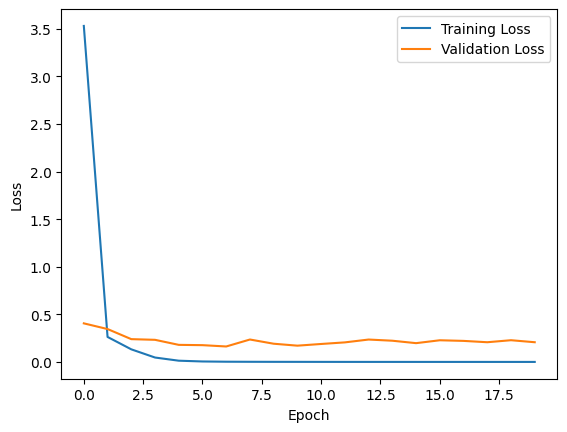

7/7 [==============================] - 1s 79ms/step - loss: 0.2070 - accuracy: 0.9350
Validation Accuracy: 0.9350000023841858
1/1 [==============================] - 0s 177ms/step
1
Prediction for 19.png: hbar_categorical


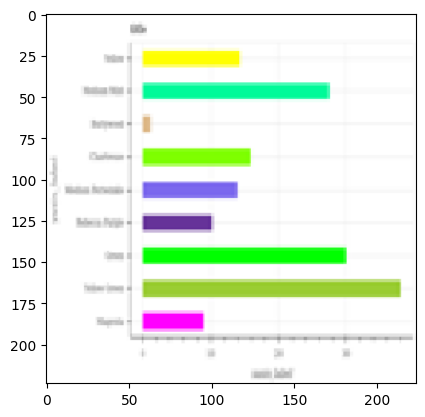

1/1 [==============================] - 0s 19ms/step
4
Prediction for 0.png: vbar_categorical


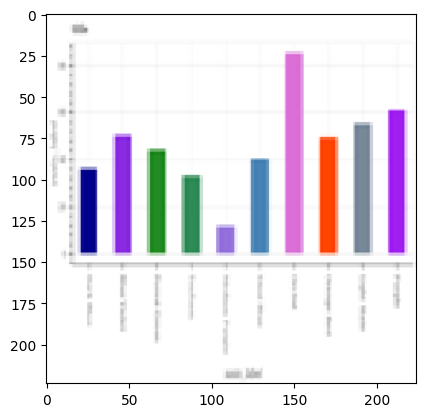

1/1 [==============================] - 0s 17ms/step
2
Prediction for 12.png: line


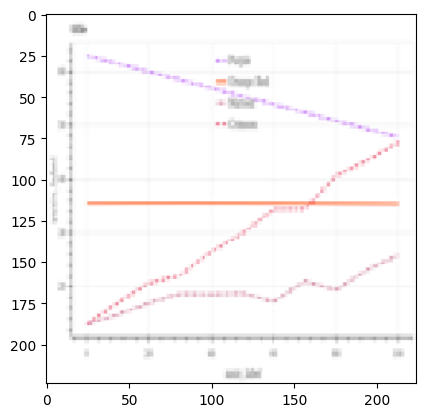

1/1 [==============================] - 0s 20ms/step
4
Prediction for 38.png: vbar_categorical


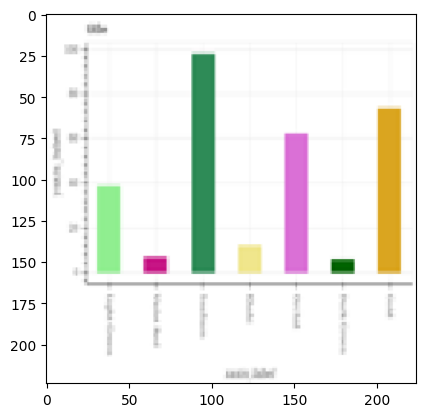

1/1 [==============================] - 0s 18ms/step
1
Prediction for 3.png: hbar_categorical


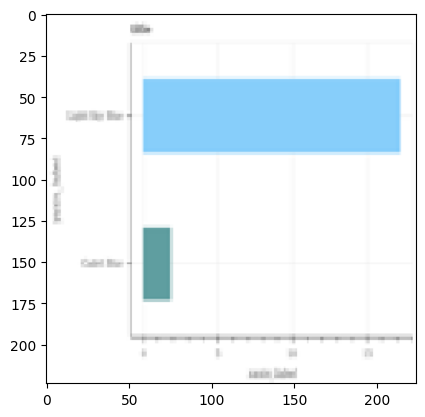

1/1 [==============================] - 0s 19ms/step
3
Prediction for 29.png: pie


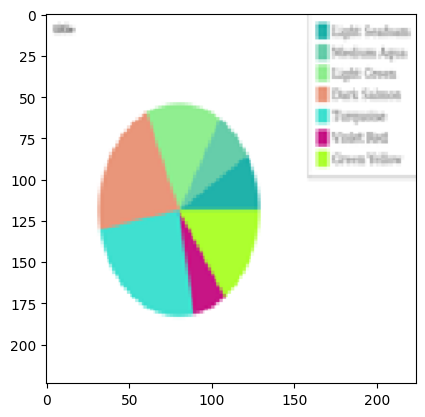

1/1 [==============================] - 0s 21ms/step
0
Prediction for 22.png: dot_line


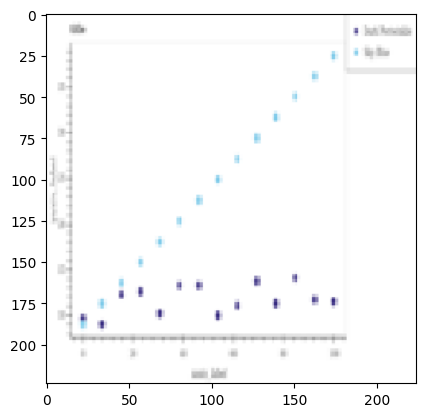

1/1 [==============================] - 0s 18ms/step
2
Prediction for 27.png: line


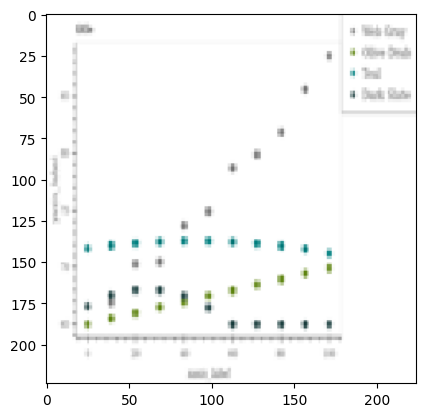

1/1 [==============================] - 0s 19ms/step
2
Prediction for 46.png: line


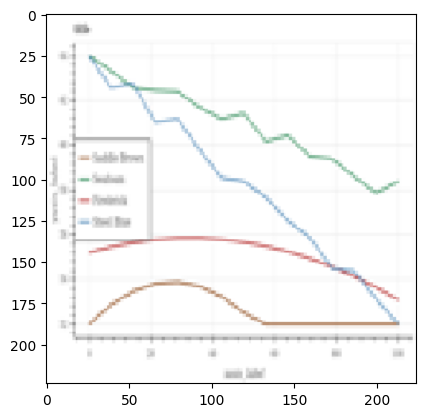

1/1 [==============================] - 0s 18ms/step
1
Prediction for 18.png: hbar_categorical


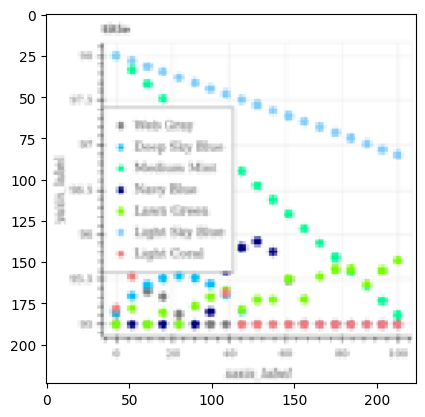

1/1 [==============================] - 0s 18ms/step
2
Prediction for 15.png: line


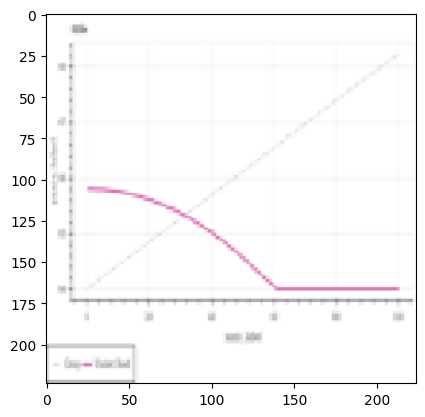

1/1 [==============================] - 0s 18ms/step
3
Prediction for 21.png: pie


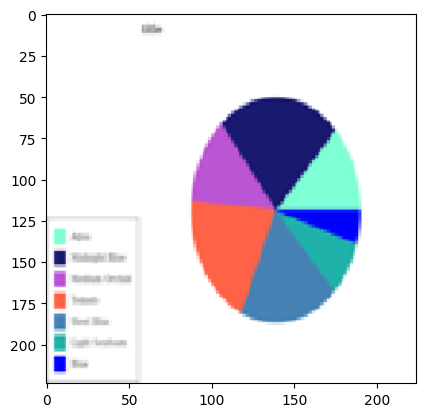

1/1 [==============================] - 0s 20ms/step
3
Prediction for 28.png: pie


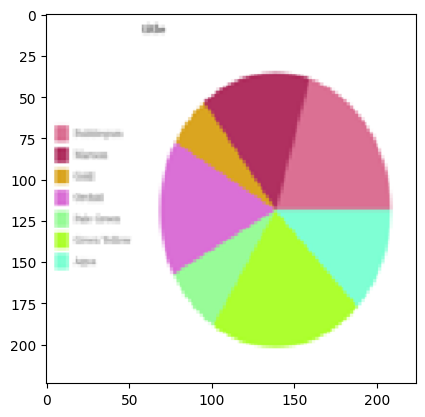

1/1 [==============================] - 0s 17ms/step
1
Prediction for 1.png: hbar_categorical


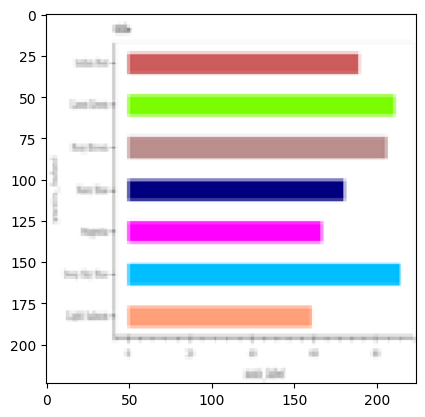

1/1 [==============================] - 0s 17ms/step
3
Prediction for 48.png: pie


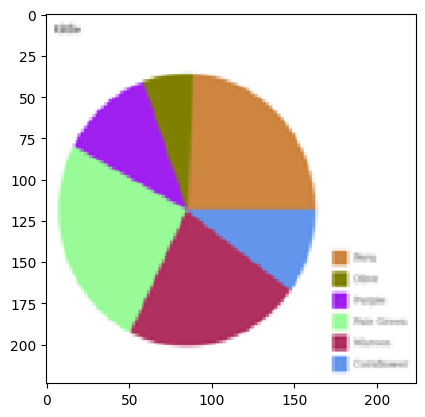

1/1 [==============================] - 0s 19ms/step
2
Prediction for 8.png: line


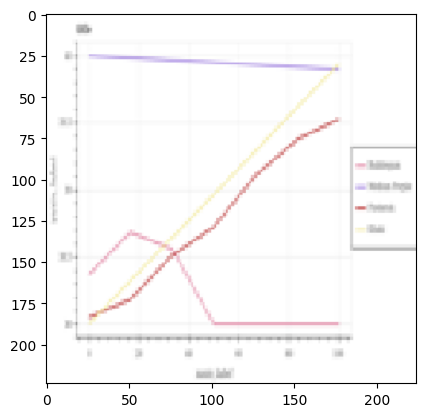

1/1 [==============================] - 0s 22ms/step
4
Prediction for 7.png: vbar_categorical


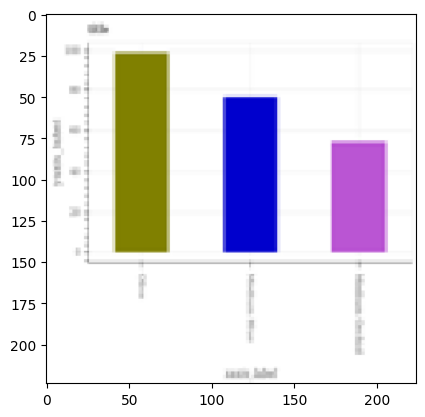

1/1 [==============================] - 0s 19ms/step
1
Prediction for 30.png: hbar_categorical


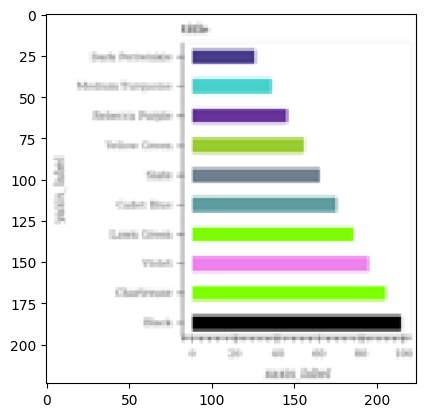

1/1 [==============================] - 0s 20ms/step
1
Prediction for 26.png: hbar_categorical


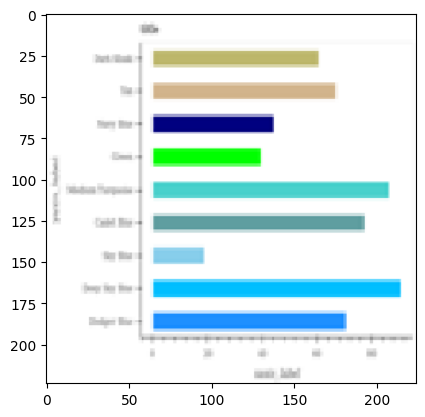

1/1 [==============================] - 0s 33ms/step
0
Prediction for 39.png: dot_line


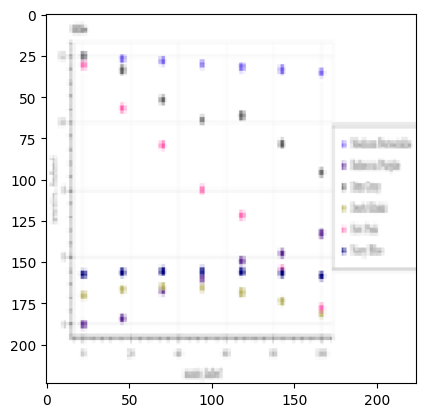

1/1 [==============================] - 0s 25ms/step
2
Prediction for 35.png: line


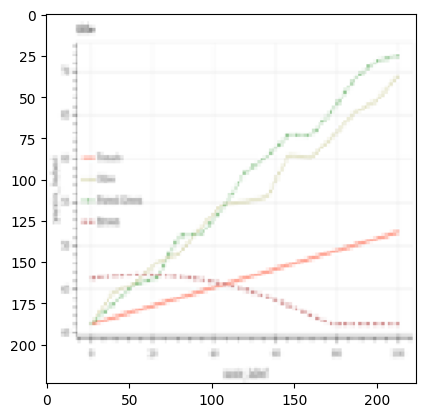

1/1 [==============================] - 0s 29ms/step
2
Prediction for 13.png: line


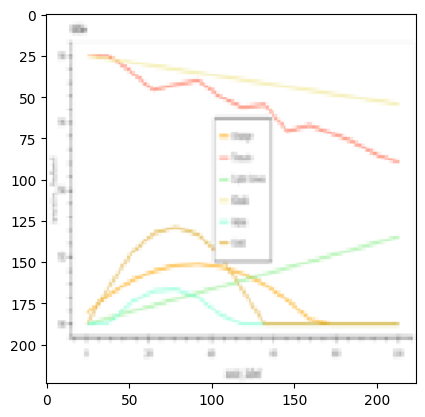

1/1 [==============================] - 0s 27ms/step
4
Prediction for 36.png: vbar_categorical


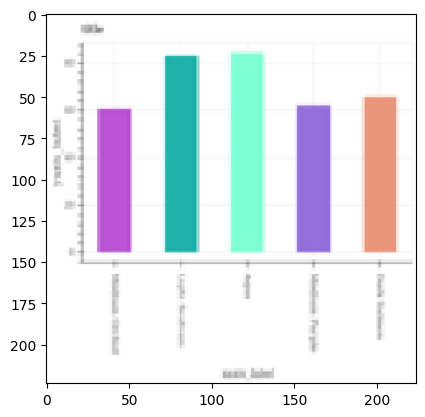

1/1 [==============================] - 0s 27ms/step
2
Prediction for 49.png: line


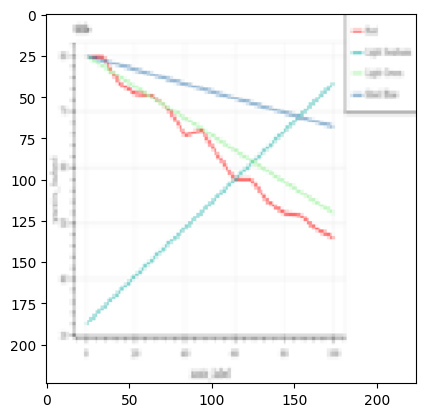

1/1 [==============================] - 0s 31ms/step
0
Prediction for 20.png: dot_line


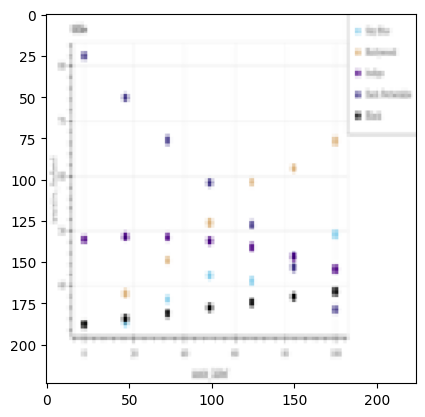

1/1 [==============================] - 0s 29ms/step
4
Prediction for 24.png: vbar_categorical


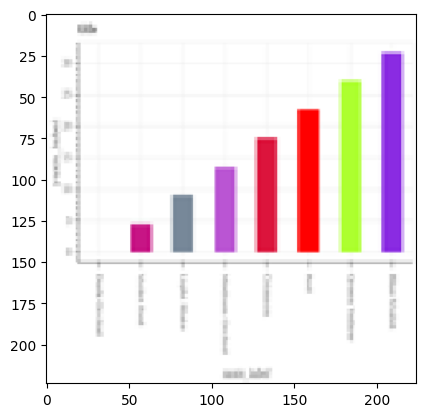

1/1 [==============================] - 0s 21ms/step
3
Prediction for 47.png: pie


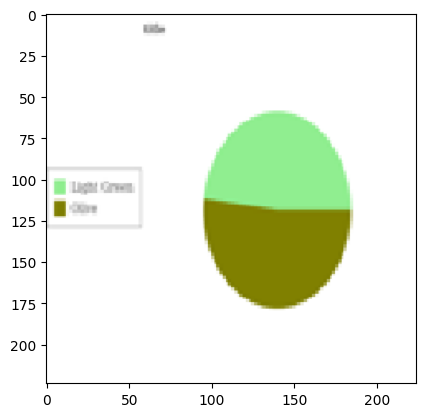

1/1 [==============================] - 0s 20ms/step
4
Prediction for 41.png: vbar_categorical


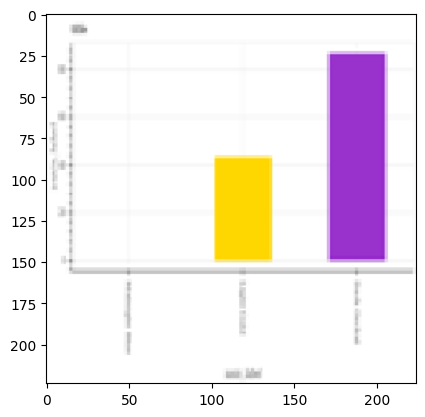

1/1 [==============================] - 0s 19ms/step
2
Prediction for 9.png: line


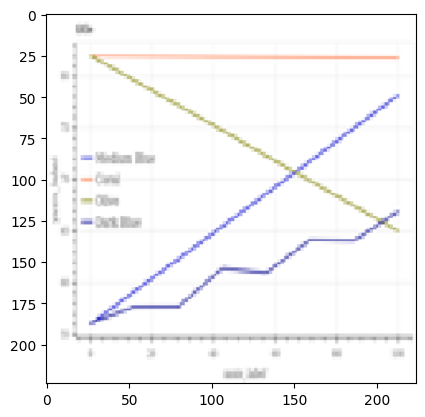

1/1 [==============================] - 0s 19ms/step
4
Prediction for 17.png: vbar_categorical


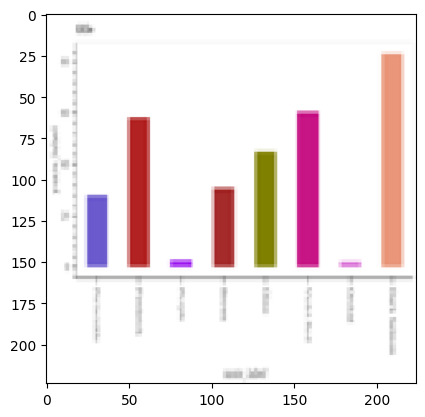

1/1 [==============================] - 0s 19ms/step
2
Prediction for 4.png: line


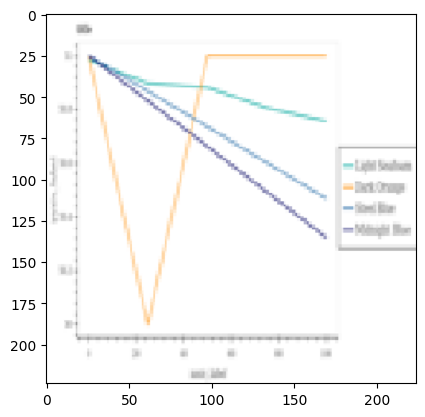

1/1 [==============================] - 0s 28ms/step
4
Prediction for 32.png: vbar_categorical


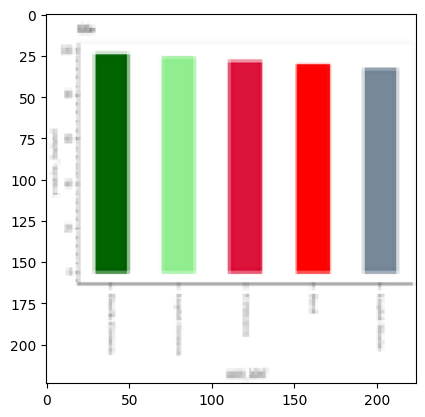

1/1 [==============================] - 0s 28ms/step
3
Prediction for 44.png: pie


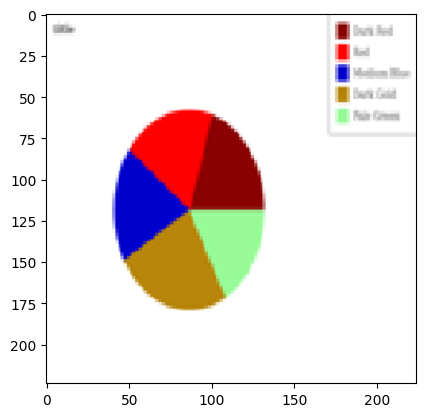

1/1 [==============================] - 0s 27ms/step
1
Prediction for 11.png: hbar_categorical


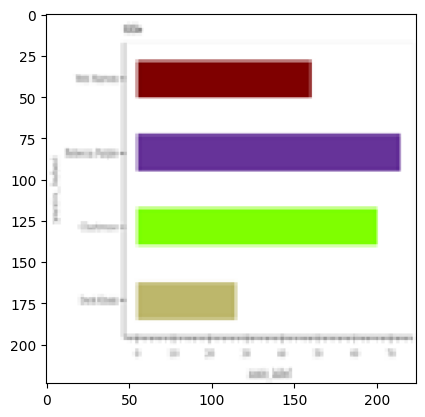

1/1 [==============================] - 0s 18ms/step
3
Prediction for 23.png: pie


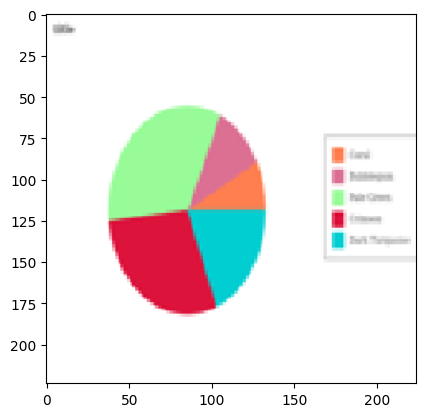

1/1 [==============================] - 0s 25ms/step
0
Prediction for 37.png: dot_line


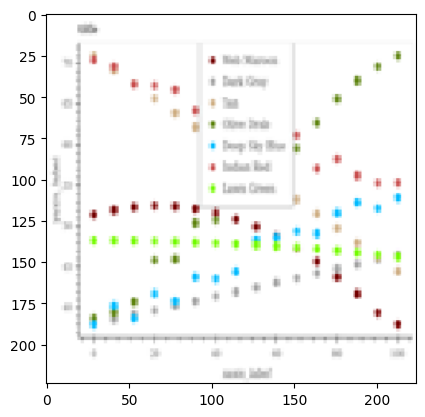

1/1 [==============================] - 0s 20ms/step
1
Prediction for 45.png: hbar_categorical


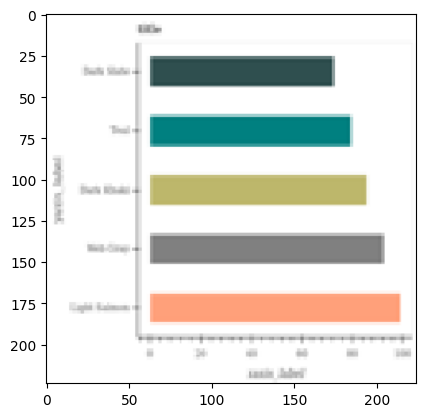

1/1 [==============================] - 0s 18ms/step
4
Prediction for 6.png: vbar_categorical


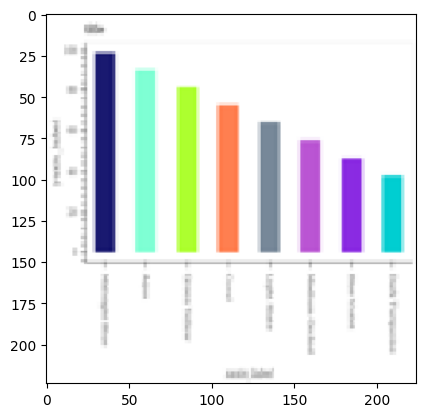

1/1 [==============================] - 0s 18ms/step
4
Prediction for 2.png: vbar_categorical


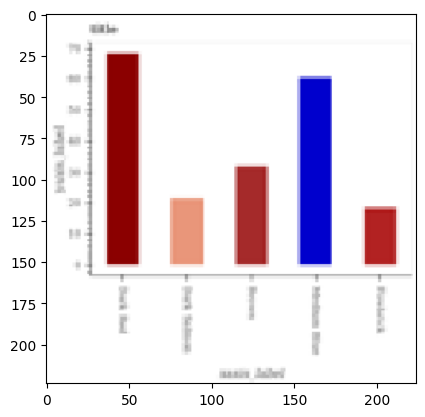

1/1 [==============================] - 0s 19ms/step
1
Prediction for 16.png: hbar_categorical


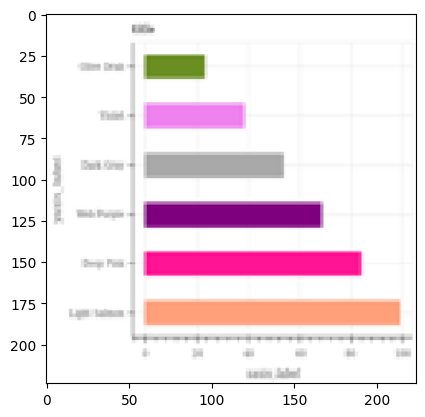

1/1 [==============================] - 0s 18ms/step
3
Prediction for 14.png: pie


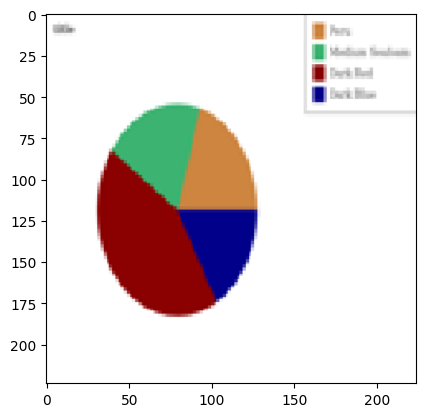

1/1 [==============================] - 0s 20ms/step
1
Prediction for 34.png: hbar_categorical


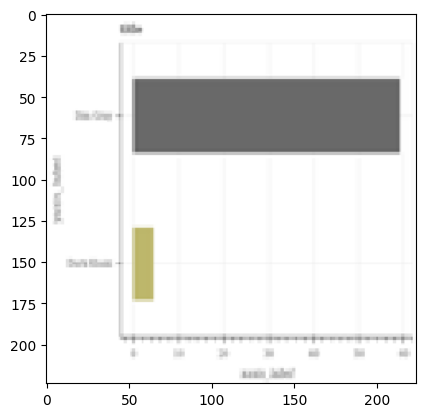

1/1 [==============================] - 0s 26ms/step
1
Prediction for 33.png: hbar_categorical


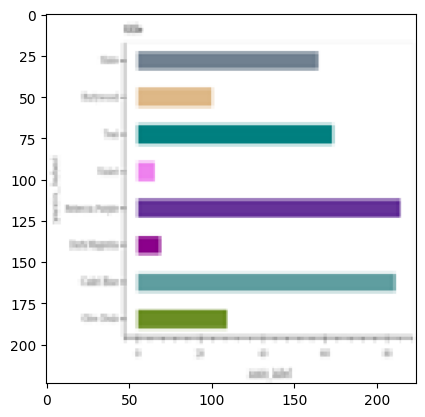

1/1 [==============================] - 0s 18ms/step
0
Prediction for 40.png: dot_line


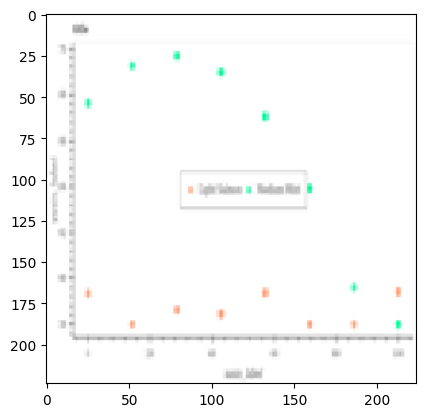

1/1 [==============================] - 0s 20ms/step
1
Prediction for 25.png: hbar_categorical


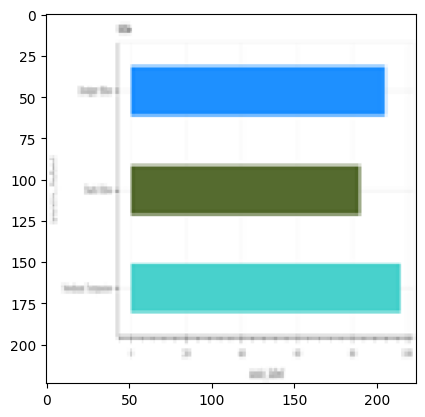

1/1 [==============================] - 0s 25ms/step
1
Prediction for 43.png: hbar_categorical


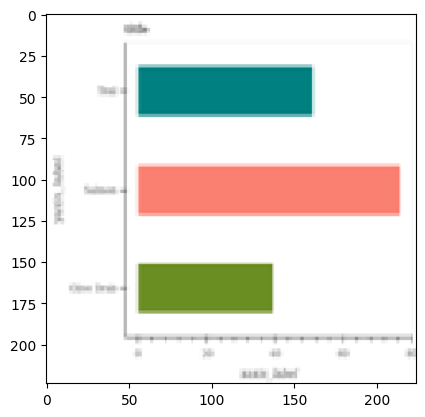

1/1 [==============================] - 0s 19ms/step
3
Prediction for 42.png: pie


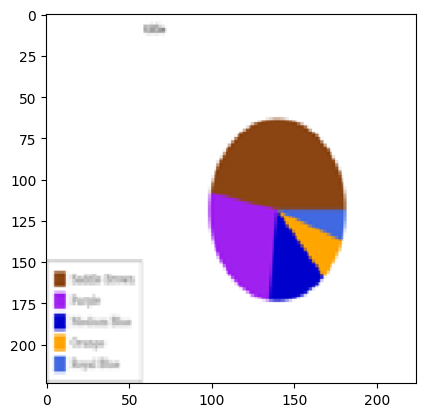

1/1 [==============================] - 0s 18ms/step
2
Prediction for 5.png: line


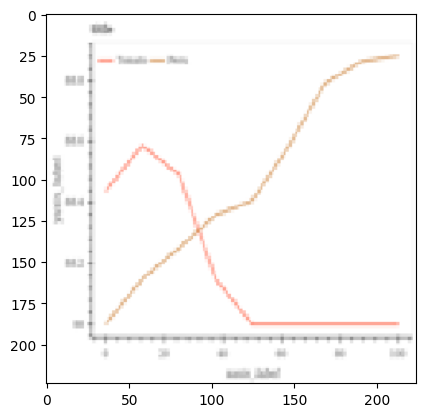

1/1 [==============================] - 0s 21ms/step
2
Prediction for 31.png: line


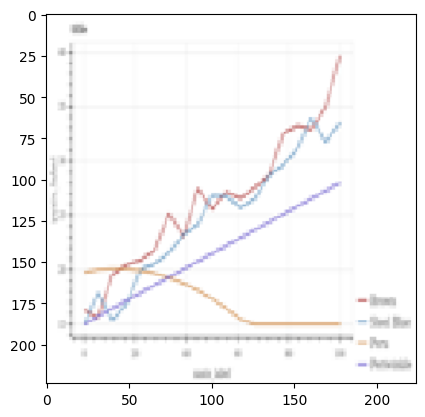

1/1 [==============================] - 0s 20ms/step
0
Prediction for 10.png: dot_line


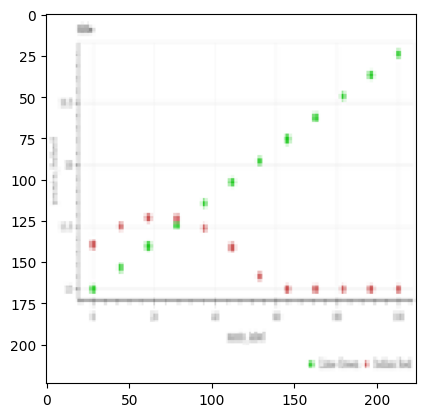

[1, 4, 2, 4, 1, 3, 0, 2, 2, 1, 2, 3, 3, 1, 3, 2, 4, 1, 1, 0, 2, 2, 4, 2, 0, 4, 3, 4, 2, 4, 2, 4, 3, 1, 3, 0, 1, 4, 4, 1, 3, 1, 1, 0, 1, 1, 3, 2, 2, 0]


In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

# Set the seed for reproducibility
tf.random.set_seed(42)

# Define the data directory paths
train_dir = '/content/drive/MyDrive/charts/charts/train_split/train'
val_dir = '/content/drive/MyDrive/charts/charts/train_split/val'

# Define the parameters for the data generator
batch_size = 32
img_height = 224
img_width = 224

# Create the training data generator
train_data_gen = keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255
)

# Create the validation data generator
val_data_gen = keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255
)

# Generate the training data from the directory
train_data = train_data_gen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical'
)

# Generate the validation data from the directory
val_data = val_data_gen.flow_from_directory(
    val_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical'
)

# Define the CNN architecture
model = keras.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_height, img_width, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(5, activation='softmax')
])

# Compile the model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(
    train_data,
    validation_data=val_data,
    epochs=20
)

# Plot the training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Evaluate the model on the validation set
val_loss, val_acc = model.evaluate(val_data)
print('Validation Accuracy:', val_acc)
test_dir = '/content/drive/MyDrive/charts/charts/test'
predict_labels(test_dir, model)


**Validating all the Data inside the Dot_Line SubFolder is Predicted Correctly**

1/1 [==============================] - 0s 20ms/step
2
Prediction for 848.png: line


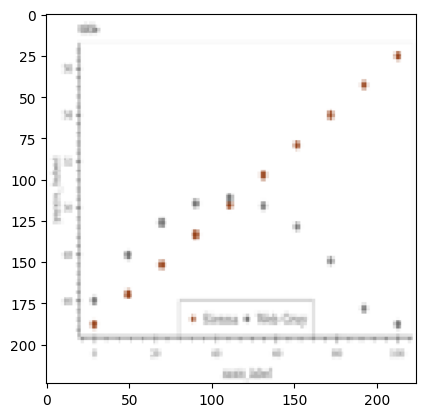

1/1 [==============================] - 0s 22ms/step
0
Prediction for 833.png: dot_line


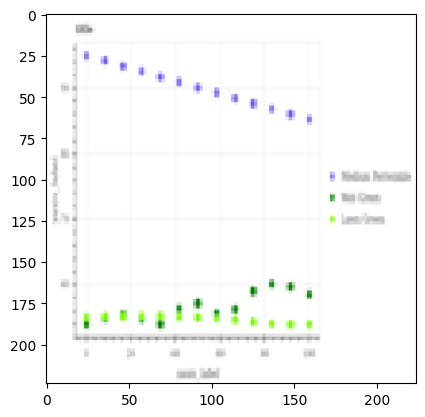

1/1 [==============================] - 0s 18ms/step
0
Prediction for 861.png: dot_line


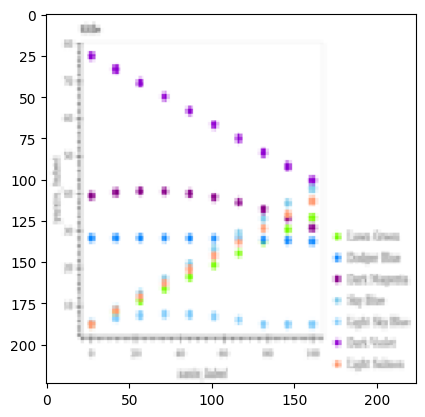

1/1 [==============================] - 0s 18ms/step
2
Prediction for 931.png: line


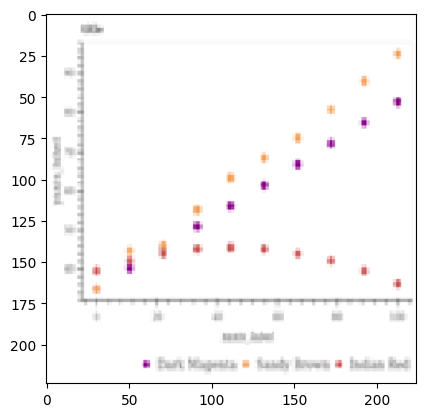

1/1 [==============================] - 0s 18ms/step
0
Prediction for 950.png: dot_line


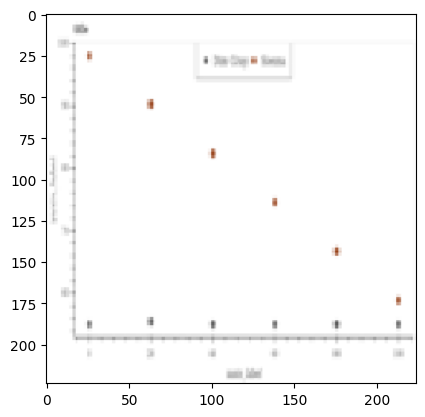

1/1 [==============================] - 0s 21ms/step
0
Prediction for 904.png: dot_line


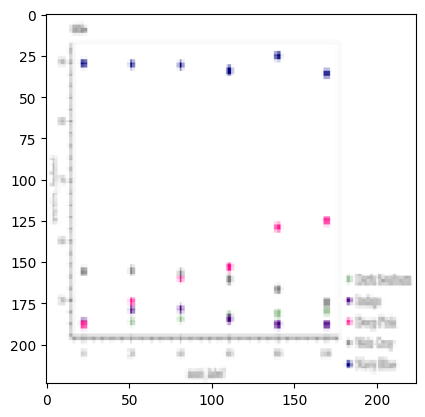

1/1 [==============================] - 0s 23ms/step
0
Prediction for 906.png: dot_line


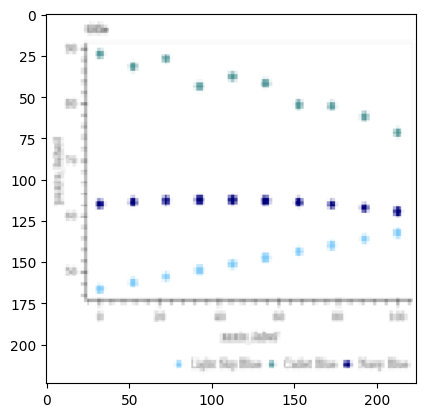

1/1 [==============================] - 0s 18ms/step
2
Prediction for 885.png: line


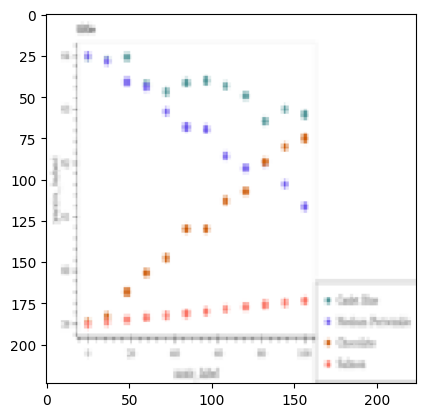

1/1 [==============================] - 0s 19ms/step
0
Prediction for 965.png: dot_line


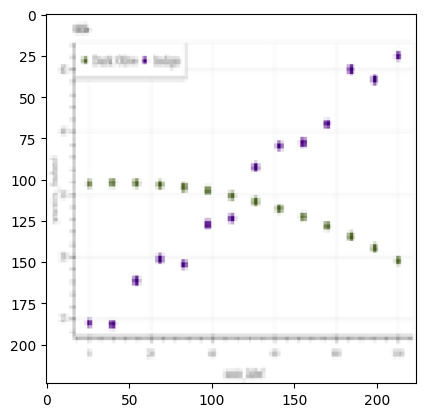

1/1 [==============================] - 0s 20ms/step
2
Prediction for 859.png: line


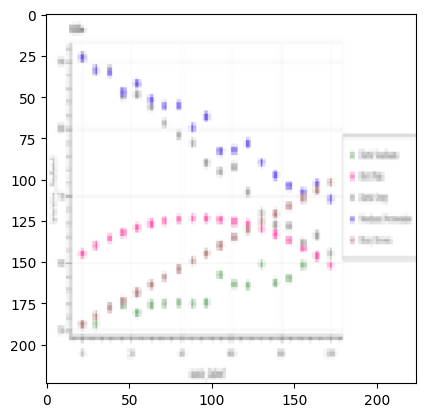

1/1 [==============================] - 0s 21ms/step
0
Prediction for 976.png: dot_line


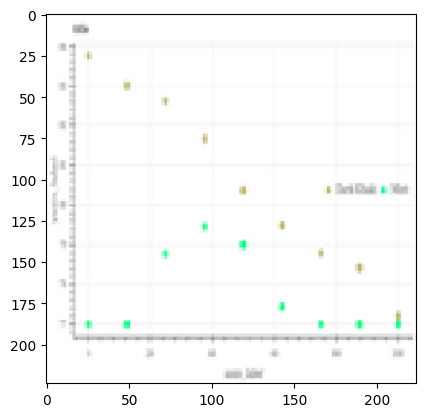

1/1 [==============================] - 0s 21ms/step
0
Prediction for 852.png: dot_line


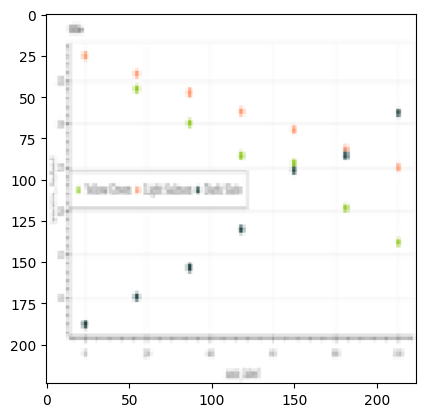

1/1 [==============================] - 0s 24ms/step
2
Prediction for 903.png: line


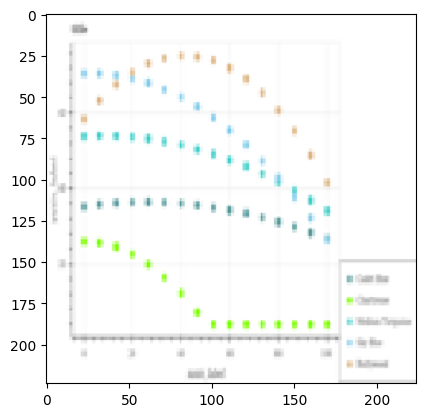

1/1 [==============================] - 0s 19ms/step
0
Prediction for 823.png: dot_line


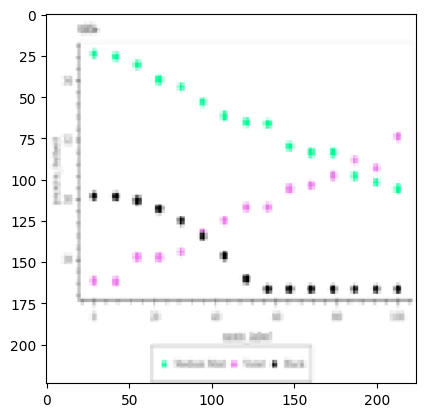

1/1 [==============================] - 0s 19ms/step
0
Prediction for 828.png: dot_line


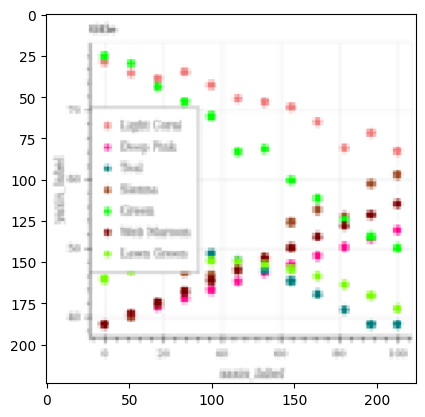

1/1 [==============================] - 0s 28ms/step
0
Prediction for 844.png: dot_line


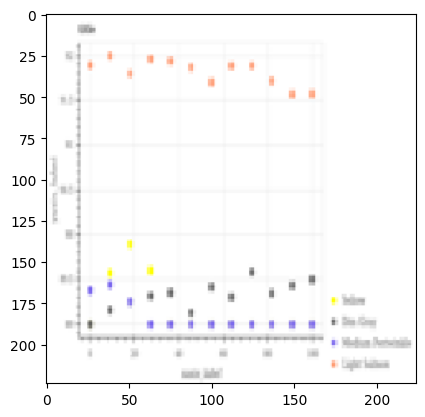

1/1 [==============================] - 0s 26ms/step
2
Prediction for 938.png: line


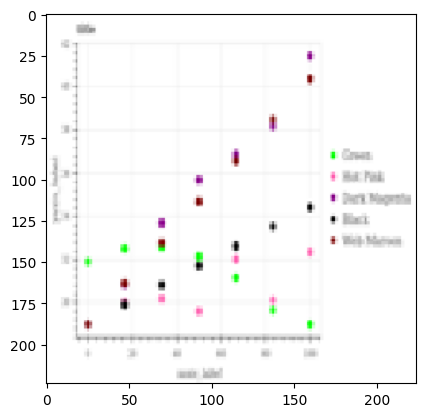

1/1 [==============================] - 0s 26ms/step
0
Prediction for 865.png: dot_line


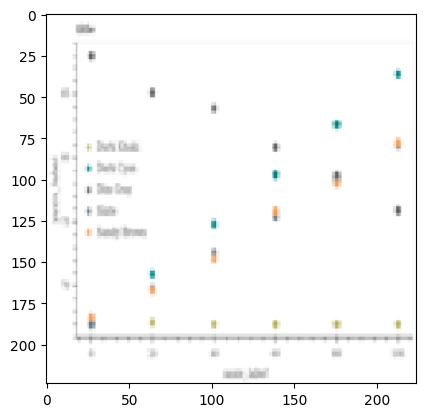

1/1 [==============================] - 0s 27ms/step
0
Prediction for 879.png: dot_line


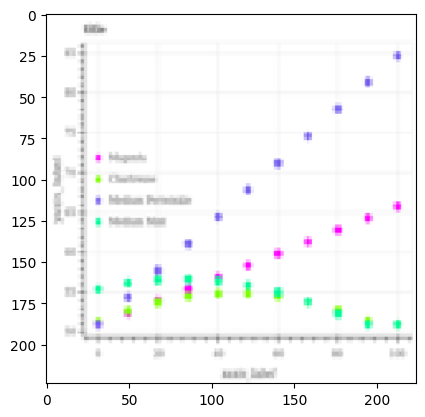

1/1 [==============================] - 0s 27ms/step
0
Prediction for 988.png: dot_line


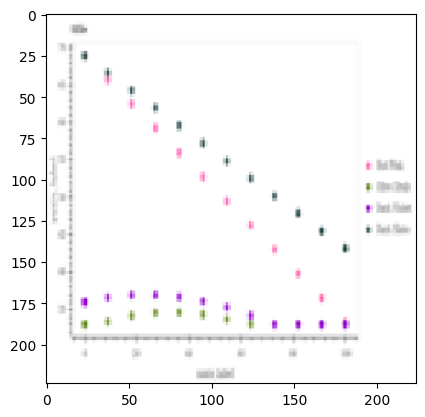

1/1 [==============================] - 0s 35ms/step
0
Prediction for 956.png: dot_line


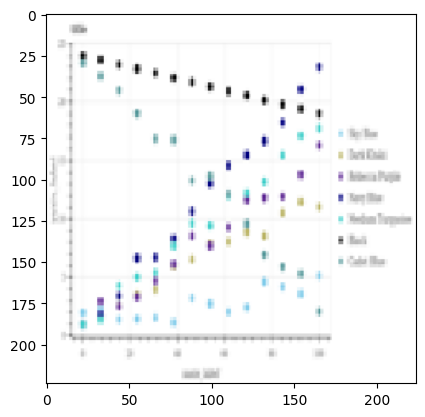

1/1 [==============================] - 0s 25ms/step
0
Prediction for 934.png: dot_line


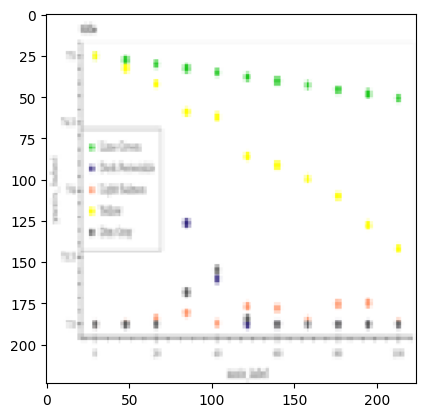

1/1 [==============================] - 0s 28ms/step
2
Prediction for 884.png: line


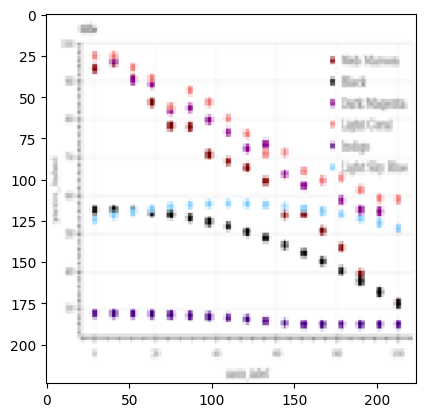

1/1 [==============================] - 0s 27ms/step
0
Prediction for 864.png: dot_line


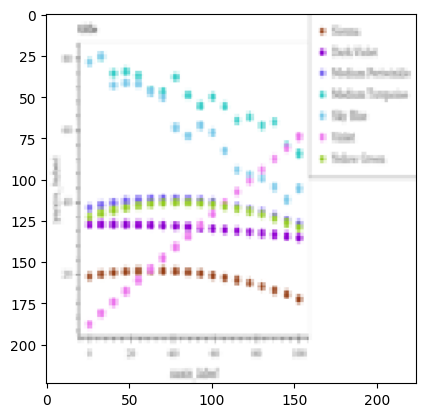

1/1 [==============================] - 0s 28ms/step
0
Prediction for 820.png: dot_line


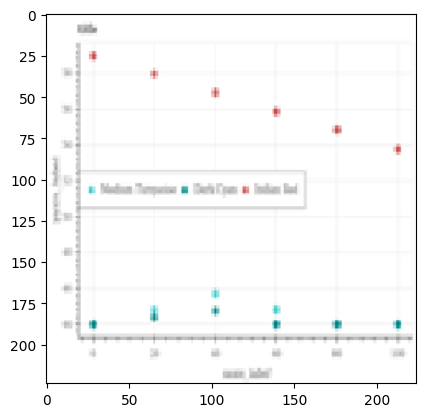

1/1 [==============================] - 0s 36ms/step
0
Prediction for 869.png: dot_line


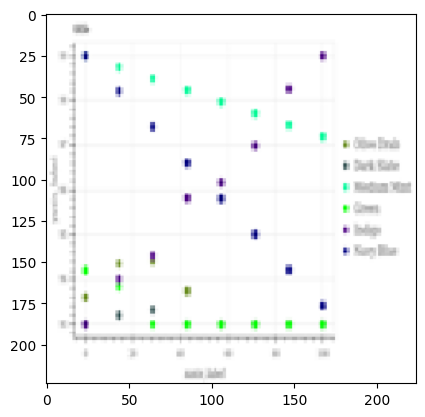

1/1 [==============================] - 0s 80ms/step
2
Prediction for 804.png: line


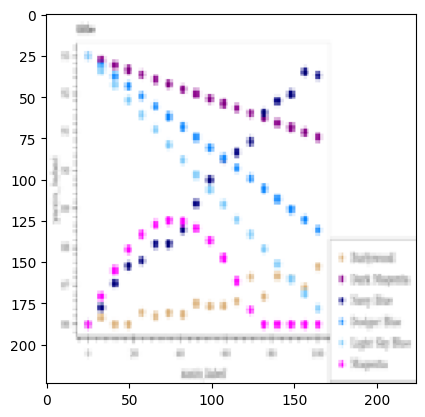

1/1 [==============================] - 0s 56ms/step
0
Prediction for 872.png: dot_line


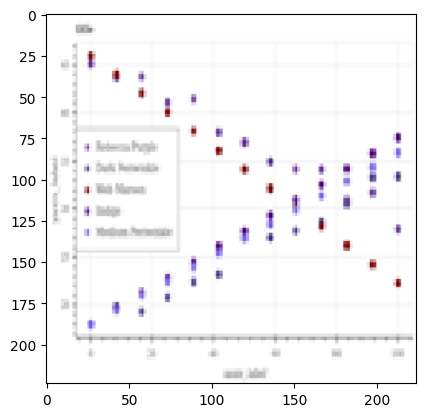

1/1 [==============================] - 0s 41ms/step
0
Prediction for 891.png: dot_line


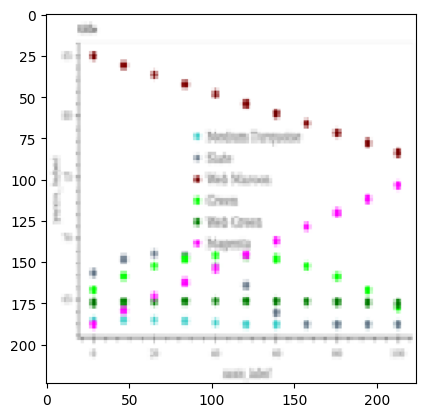

1/1 [==============================] - 0s 25ms/step
0
Prediction for 937.png: dot_line


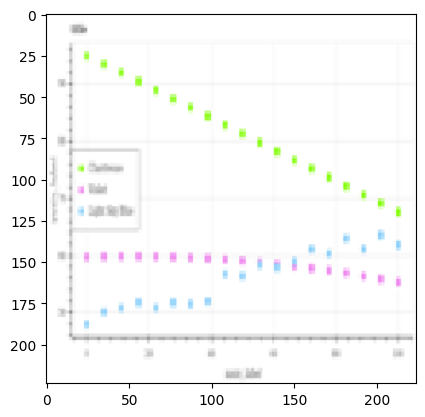

1/1 [==============================] - 0s 31ms/step
0
Prediction for 969.png: dot_line


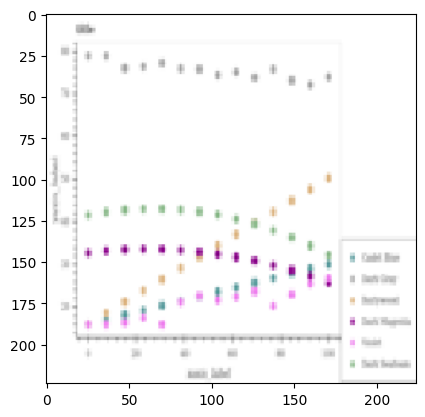

1/1 [==============================] - 0s 21ms/step
0
Prediction for 814.png: dot_line


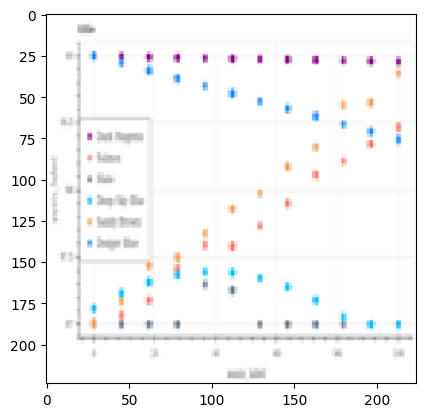

1/1 [==============================] - 0s 22ms/step
0
Prediction for 811.png: dot_line


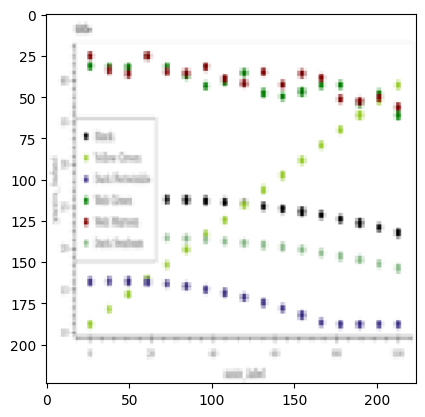

1/1 [==============================] - 0s 21ms/step
0
Prediction for 966.png: dot_line


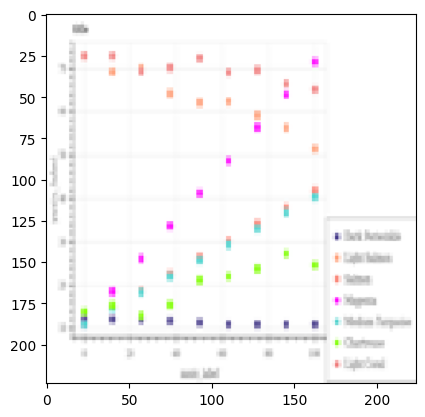

1/1 [==============================] - 0s 22ms/step
0
Prediction for 841.png: dot_line


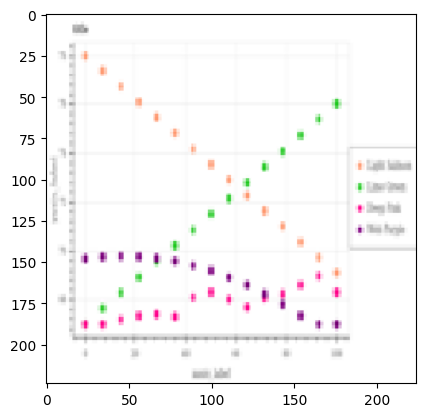

1/1 [==============================] - 0s 19ms/step
0
Prediction for 856.png: dot_line


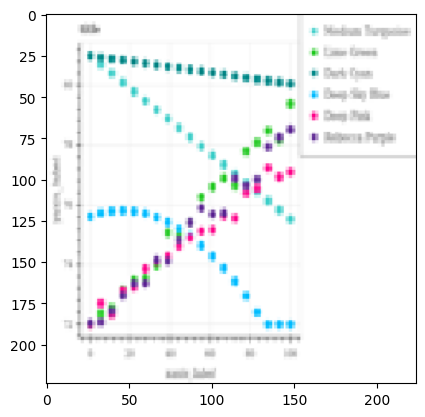

1/1 [==============================] - 0s 21ms/step
0
Prediction for 992.png: dot_line


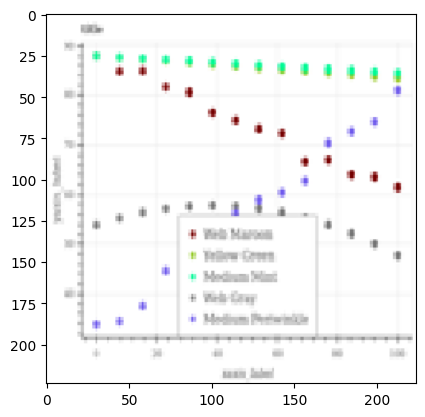

1/1 [==============================] - 0s 20ms/step
0
Prediction for 987.png: dot_line


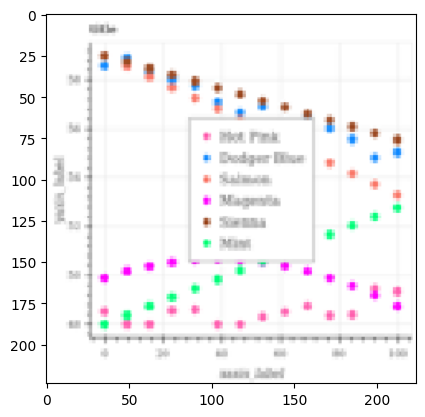

1/1 [==============================] - 0s 22ms/step
0
Prediction for 882.png: dot_line


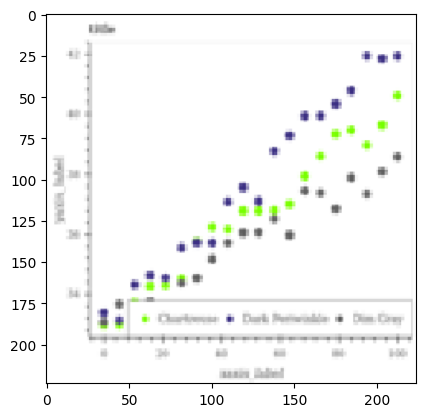

1/1 [==============================] - 0s 18ms/step
2
Prediction for 817.png: line


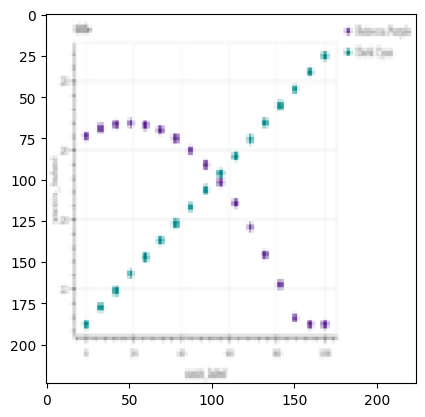

[2, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2]


In [ ]:
test_dir = '/content/drive/MyDrive/charts/charts/train_split/val/dot_line'
predict_labels(test_dir, model)

**Validating all the Data inside the hbar_categorical SubFolder is Predicted Correctly**

1/1 [==============================] - 0s 19ms/step
1
Prediction for 236.png: hbar_categorical


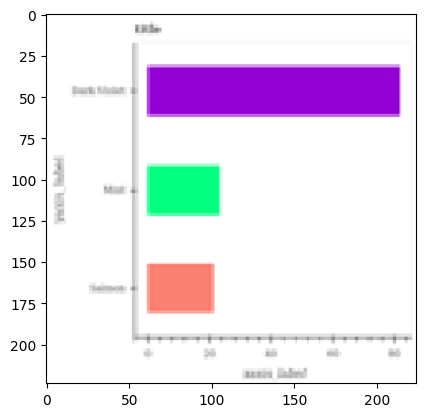

1/1 [==============================] - 0s 20ms/step
1
Prediction for 382.png: hbar_categorical


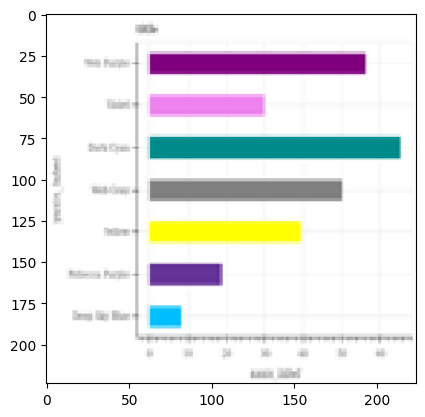

1/1 [==============================] - 0s 18ms/step
1
Prediction for 392.png: hbar_categorical


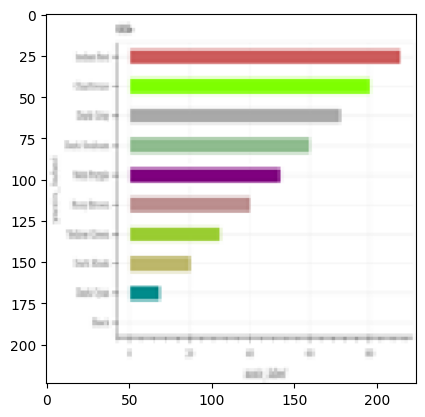

1/1 [==============================] - 0s 20ms/step
1
Prediction for 356.png: hbar_categorical


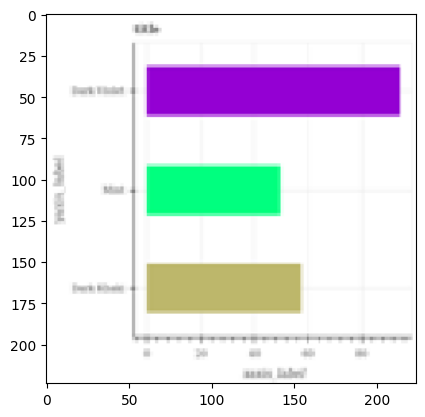

1/1 [==============================] - 0s 18ms/step
1
Prediction for 380.png: hbar_categorical


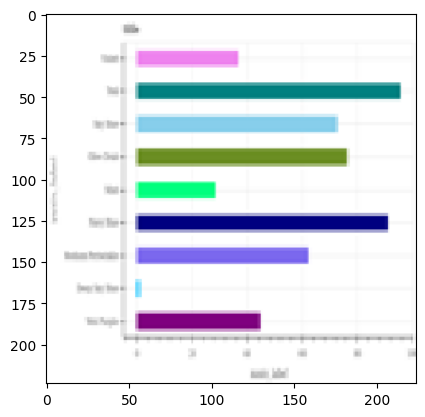

1/1 [==============================] - 0s 21ms/step
1
Prediction for 233.png: hbar_categorical


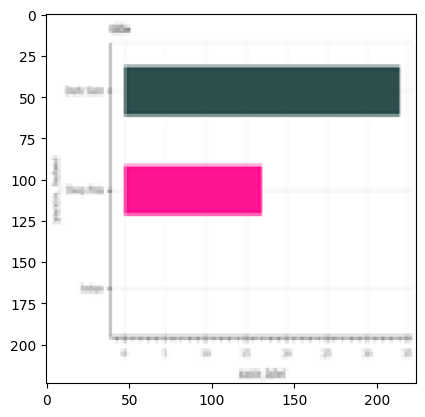

1/1 [==============================] - 0s 18ms/step
1
Prediction for 239.png: hbar_categorical


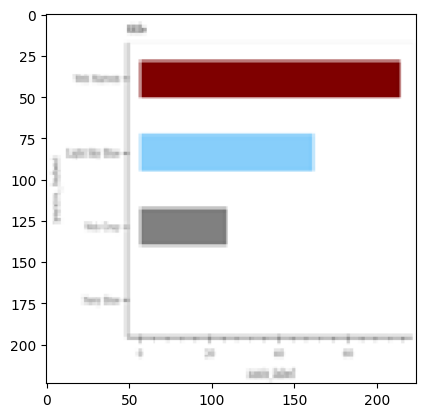

1/1 [==============================] - 0s 19ms/step
1
Prediction for 353.png: hbar_categorical


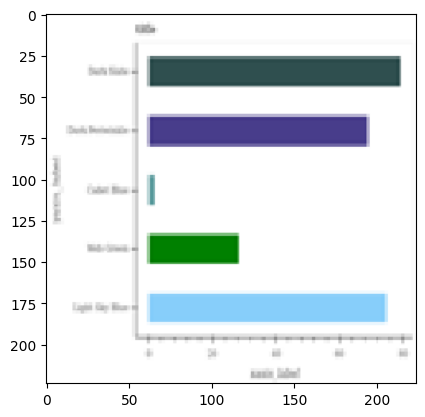

1/1 [==============================] - 0s 18ms/step
1
Prediction for 270.png: hbar_categorical


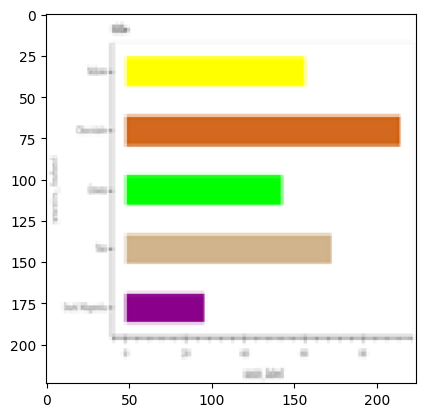

1/1 [==============================] - 0s 19ms/step
1
Prediction for 286.png: hbar_categorical


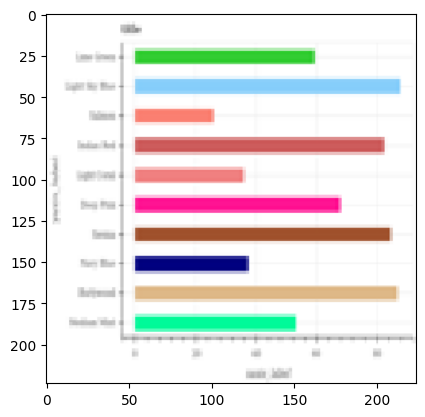

1/1 [==============================] - 0s 22ms/step
2
Prediction for 386.png: line


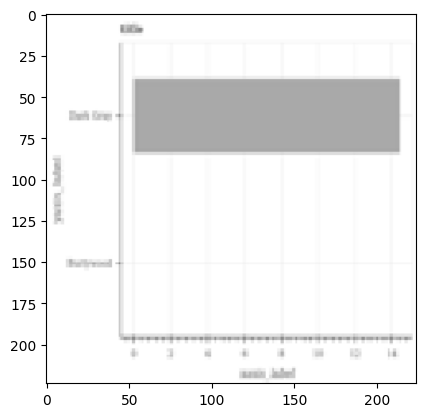

1/1 [==============================] - 0s 18ms/step
1
Prediction for 244.png: hbar_categorical


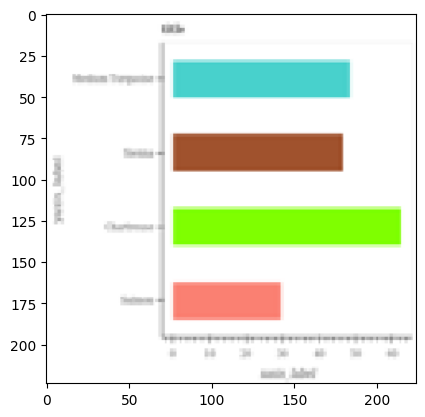

1/1 [==============================] - 0s 20ms/step
1
Prediction for 298.png: hbar_categorical


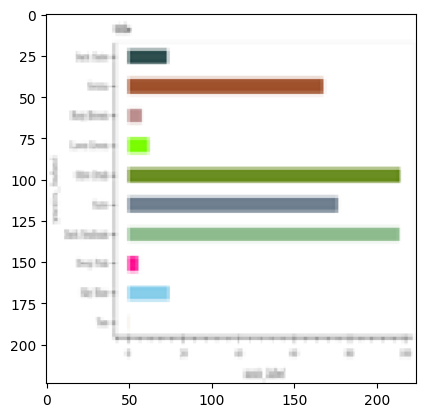

1/1 [==============================] - 0s 20ms/step
1
Prediction for 330.png: hbar_categorical


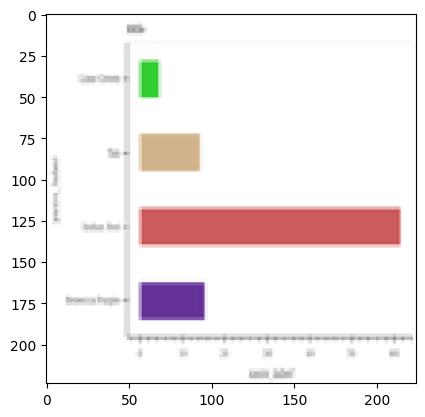

1/1 [==============================] - 0s 20ms/step
1
Prediction for 266.png: hbar_categorical


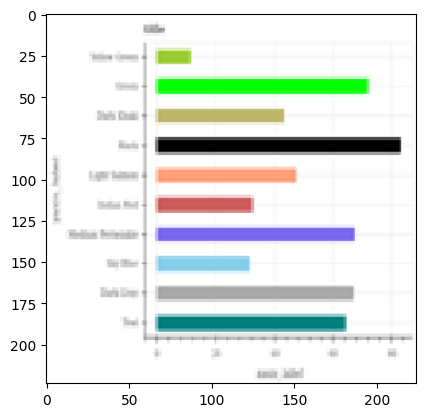

1/1 [==============================] - 0s 20ms/step
1
Prediction for 280.png: hbar_categorical


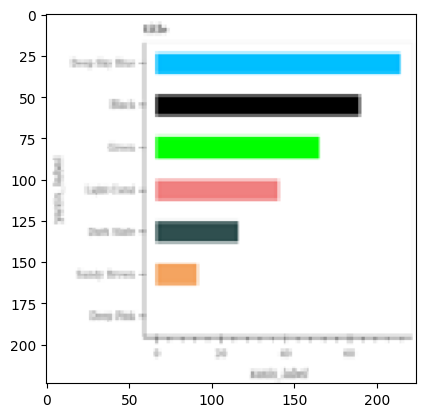

1/1 [==============================] - 0s 23ms/step
1
Prediction for 287.png: hbar_categorical


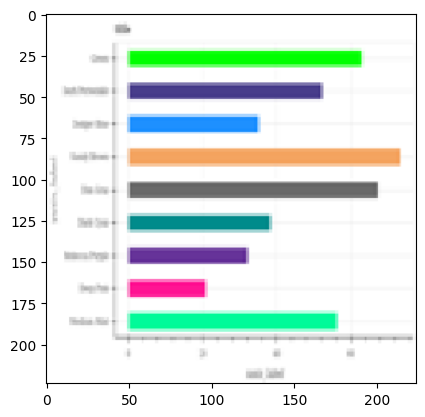

1/1 [==============================] - 0s 19ms/step
1
Prediction for 362.png: hbar_categorical


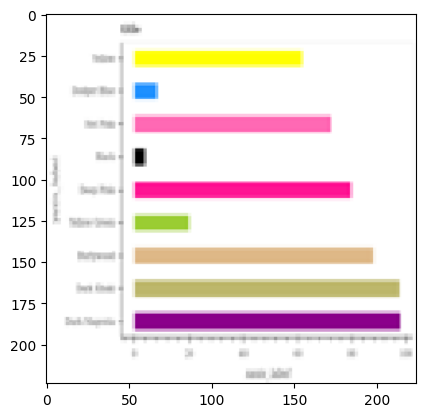

1/1 [==============================] - 0s 20ms/step
1
Prediction for 203.png: hbar_categorical


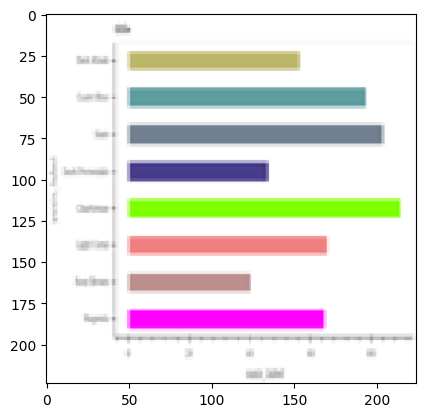

1/1 [==============================] - 0s 21ms/step
1
Prediction for 267.png: hbar_categorical


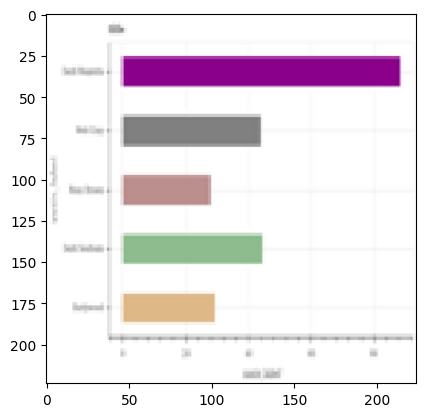

1/1 [==============================] - 0s 18ms/step
1
Prediction for 234.png: hbar_categorical


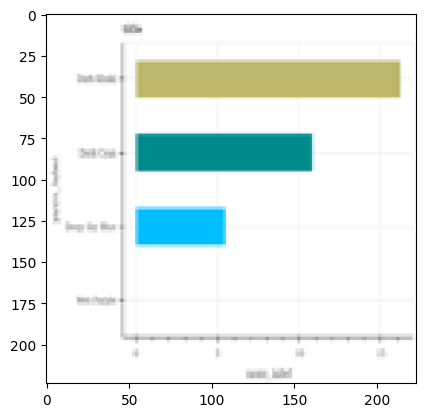

1/1 [==============================] - 0s 18ms/step
1
Prediction for 390.png: hbar_categorical


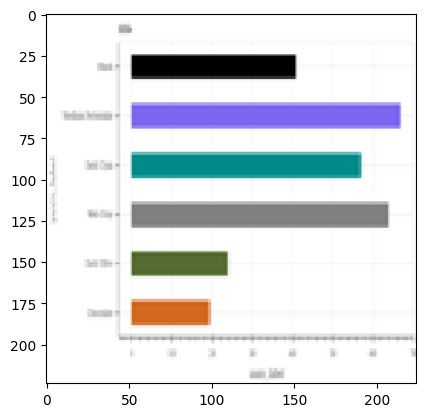

1/1 [==============================] - 0s 17ms/step
1
Prediction for 206.png: hbar_categorical


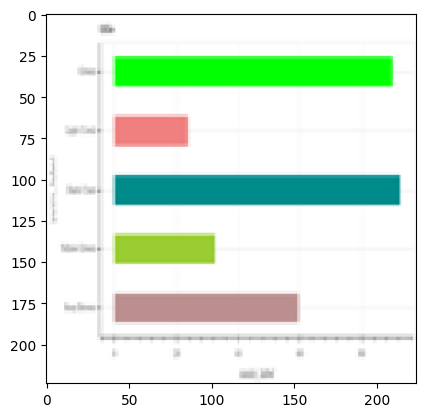

1/1 [==============================] - 0s 19ms/step
1
Prediction for 258.png: hbar_categorical


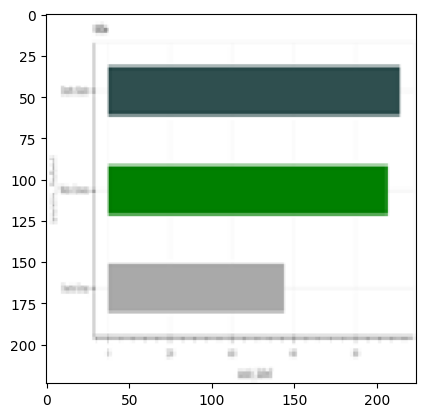

1/1 [==============================] - 0s 18ms/step
1
Prediction for 311.png: hbar_categorical


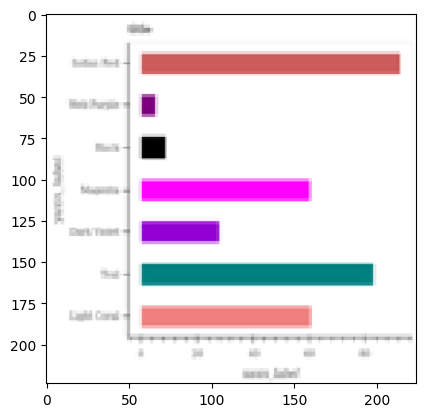

1/1 [==============================] - 0s 19ms/step
1
Prediction for 256.png: hbar_categorical


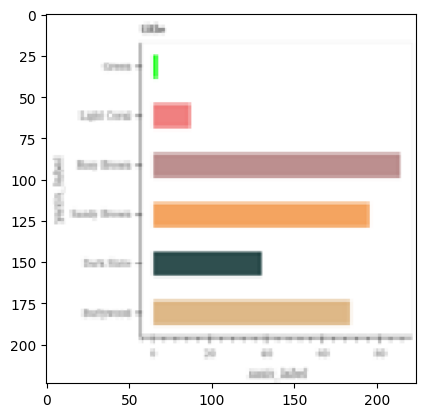

1/1 [==============================] - 0s 18ms/step
1
Prediction for 321.png: hbar_categorical


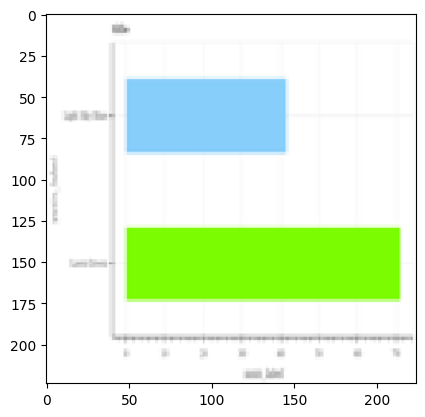

1/1 [==============================] - 0s 27ms/step
1
Prediction for 240.png: hbar_categorical


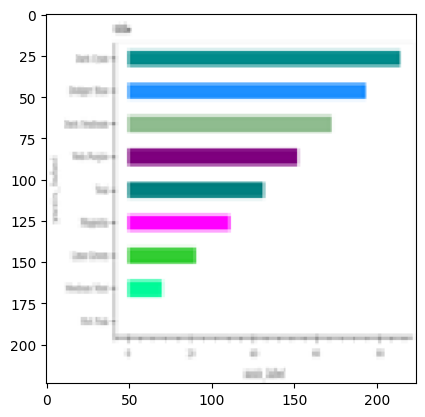

1/1 [==============================] - 0s 18ms/step
1
Prediction for 277.png: hbar_categorical


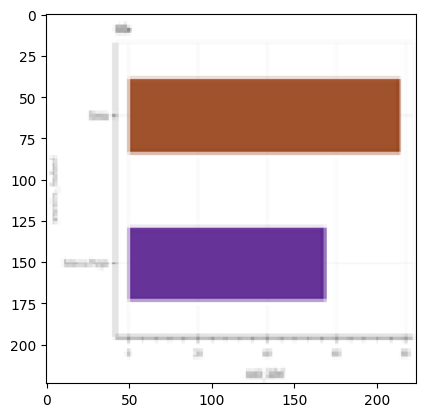

1/1 [==============================] - 0s 28ms/step
1
Prediction for 324.png: hbar_categorical


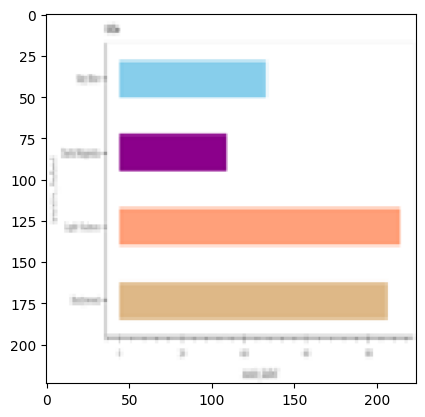

1/1 [==============================] - 0s 25ms/step
1
Prediction for 364.png: hbar_categorical


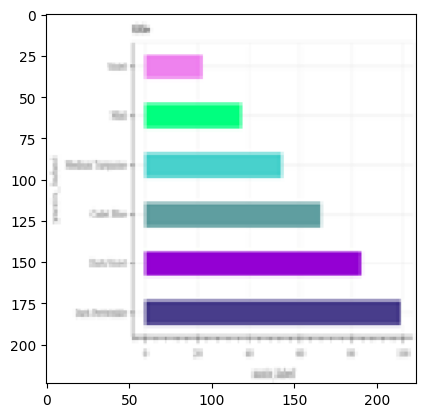

1/1 [==============================] - 0s 37ms/step
1
Prediction for 354.png: hbar_categorical


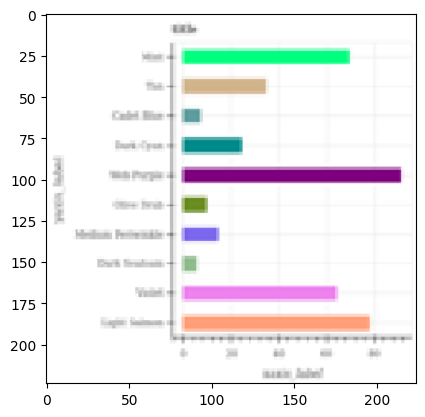

1/1 [==============================] - 0s 27ms/step
1
Prediction for 271.png: hbar_categorical


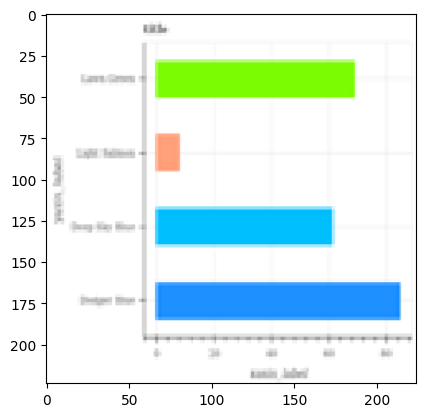

1/1 [==============================] - 0s 26ms/step
1
Prediction for 374.png: hbar_categorical


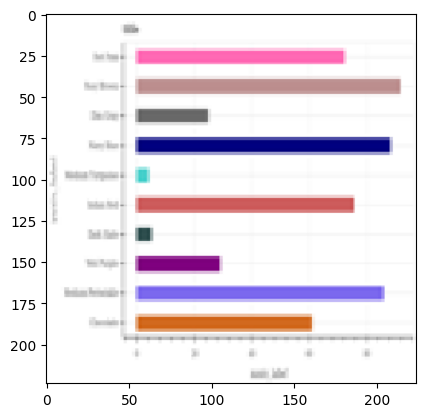

1/1 [==============================] - 0s 26ms/step
1
Prediction for 227.png: hbar_categorical


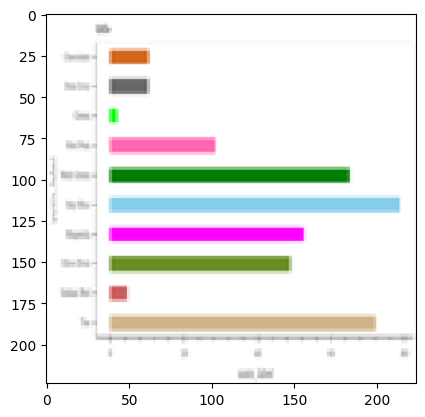

1/1 [==============================] - 0s 28ms/step
1
Prediction for 254.png: hbar_categorical


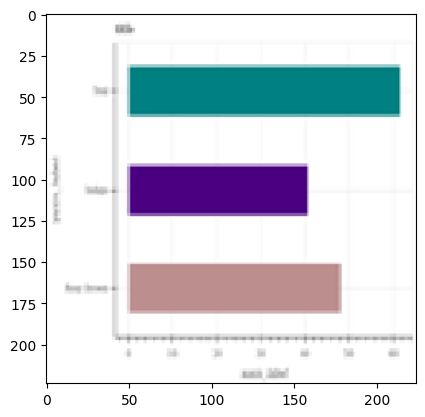

1/1 [==============================] - 0s 42ms/step
1
Prediction for 340.png: hbar_categorical


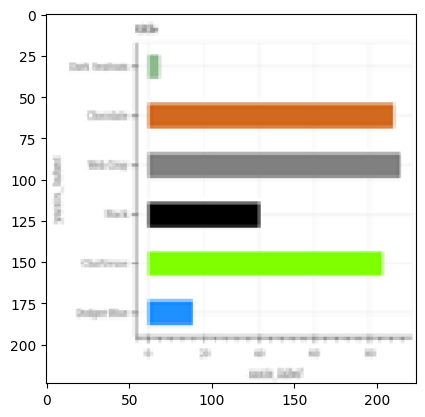

1/1 [==============================] - 0s 32ms/step
1
Prediction for 346.png: hbar_categorical


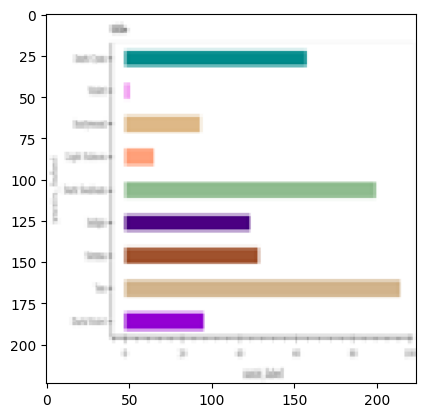

1/1 [==============================] - 0s 43ms/step
1
Prediction for 349.png: hbar_categorical


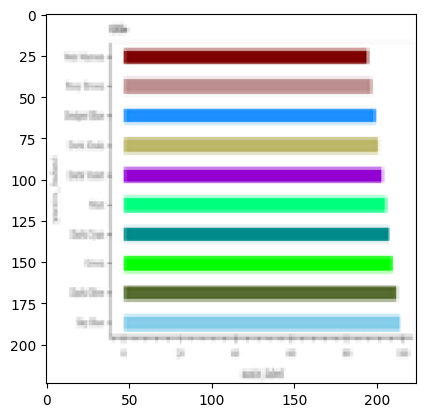

1/1 [==============================] - 0s 36ms/step
1
Prediction for 247.png: hbar_categorical


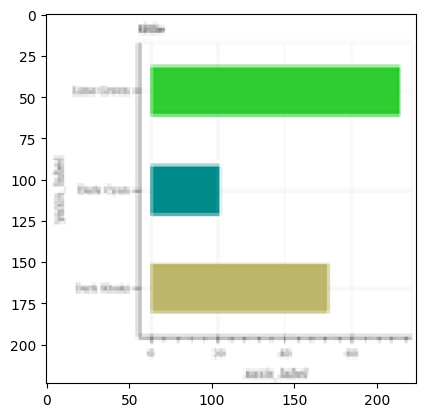

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


In [ ]:
test_dir = '/content/drive/MyDrive/charts/charts/train_split/val/hbar_categorical'
predict_labels(test_dir, model)

**Validating all the Data inside the line SubFolder is Predicted Correctly**



1/1 [==============================] - 0s 40ms/step
2
Prediction for 438.png: line


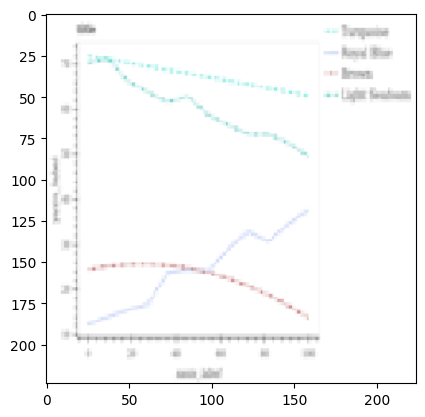

1/1 [==============================] - 0s 32ms/step
2
Prediction for 422.png: line


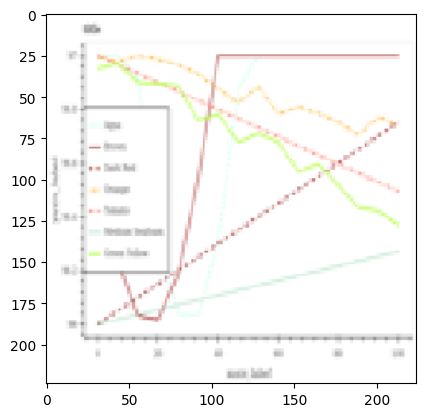

1/1 [==============================] - 0s 22ms/step
2
Prediction for 471.png: line


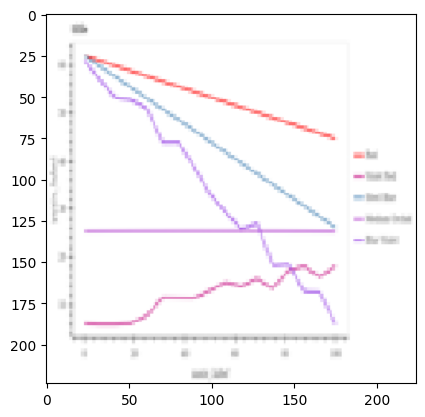

1/1 [==============================] - 0s 24ms/step
2
Prediction for 503.png: line


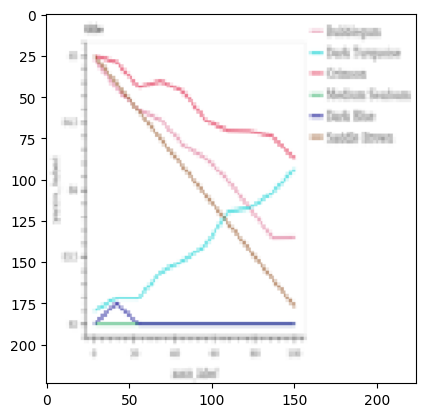

1/1 [==============================] - 0s 21ms/step
0
Prediction for 596.png: dot_line


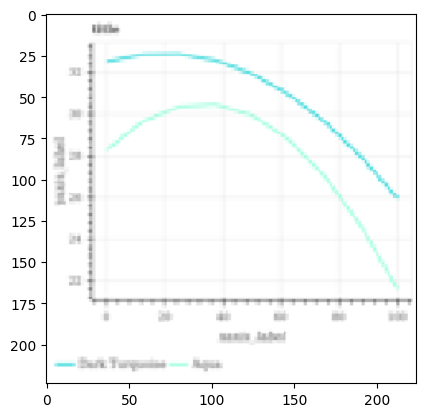

1/1 [==============================] - 0s 21ms/step
2
Prediction for 523.png: line


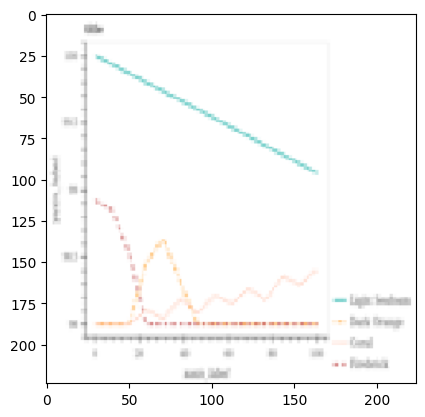

1/1 [==============================] - 0s 19ms/step
2
Prediction for 408.png: line


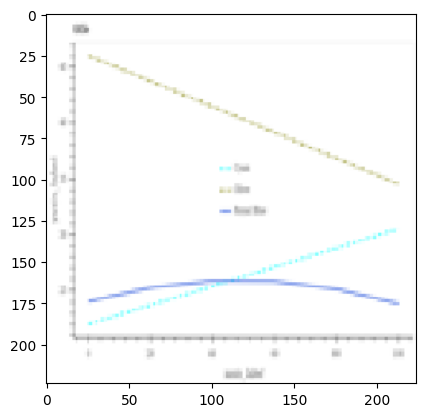

1/1 [==============================] - 0s 28ms/step
2
Prediction for 526.png: line


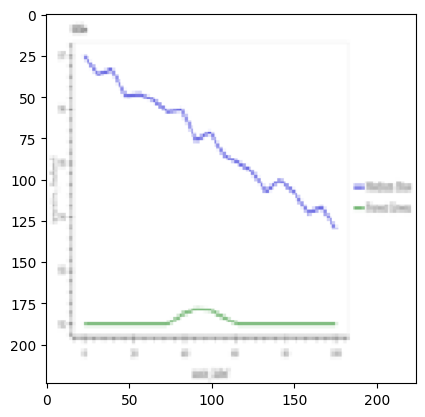

1/1 [==============================] - 0s 21ms/step
2
Prediction for 571.png: line


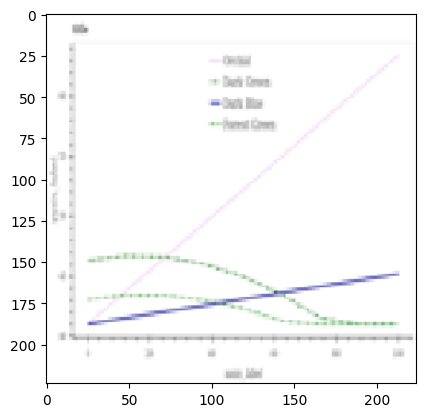

1/1 [==============================] - 0s 21ms/step
2
Prediction for 406.png: line


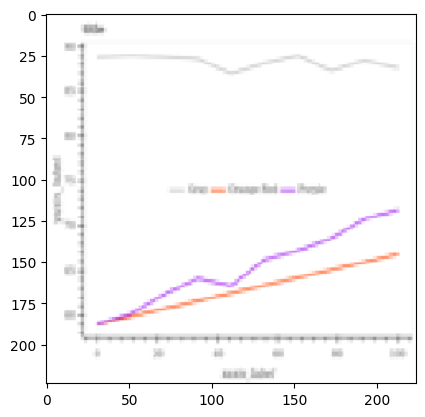

1/1 [==============================] - 0s 18ms/step
2
Prediction for 547.png: line


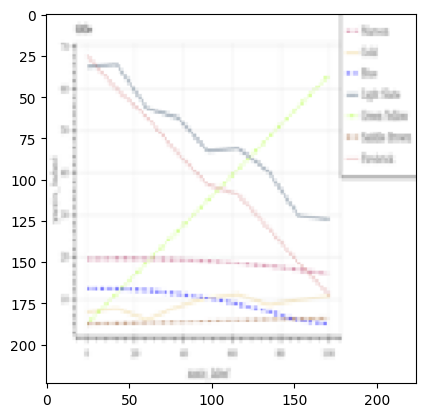

1/1 [==============================] - 0s 20ms/step
2
Prediction for 496.png: line


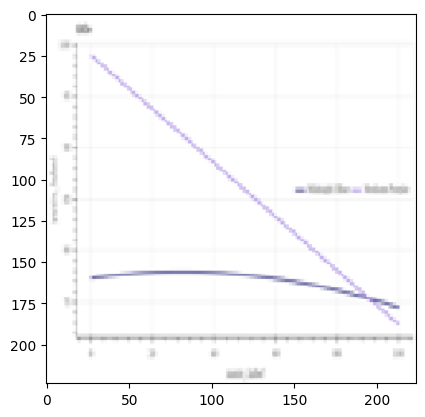

1/1 [==============================] - 0s 22ms/step
2
Prediction for 401.png: line


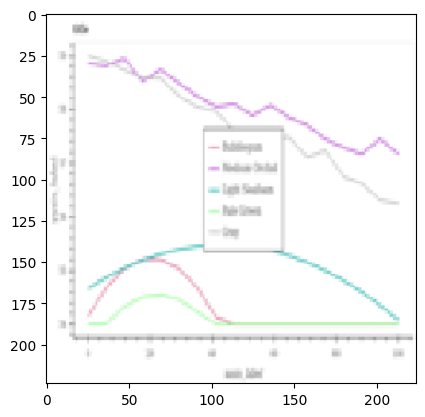

1/1 [==============================] - 0s 19ms/step
2
Prediction for 509.png: line


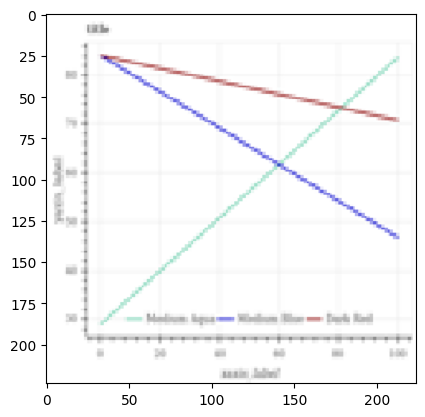

1/1 [==============================] - 0s 21ms/step
2
Prediction for 499.png: line


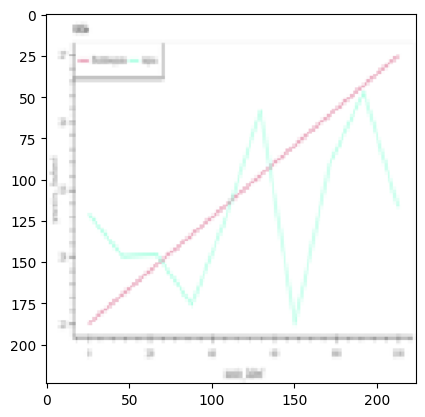

1/1 [==============================] - 0s 24ms/step
2
Prediction for 423.png: line


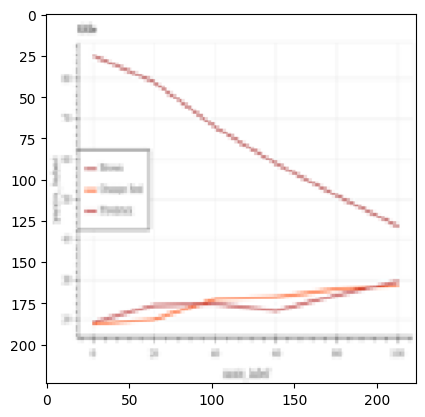

1/1 [==============================] - 0s 21ms/step
2
Prediction for 441.png: line


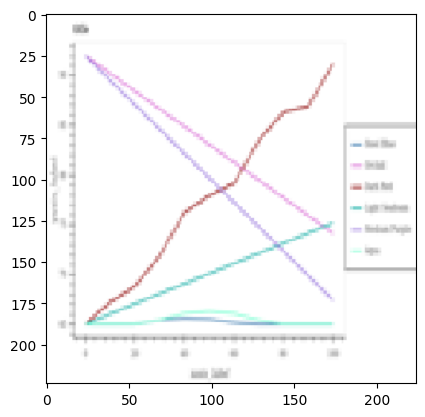

1/1 [==============================] - 0s 20ms/step
2
Prediction for 514.png: line


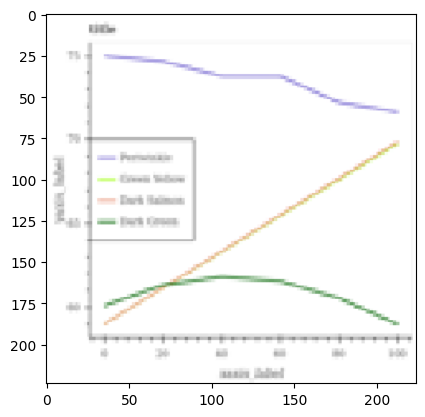

1/1 [==============================] - 0s 21ms/step
2
Prediction for 472.png: line


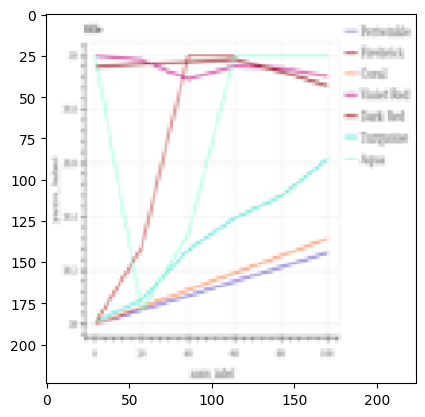

1/1 [==============================] - 0s 20ms/step
2
Prediction for 537.png: line


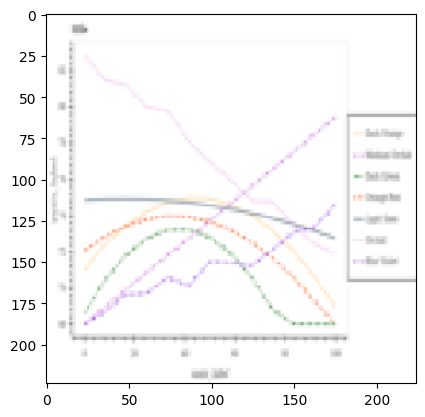

1/1 [==============================] - 0s 19ms/step
2
Prediction for 580.png: line


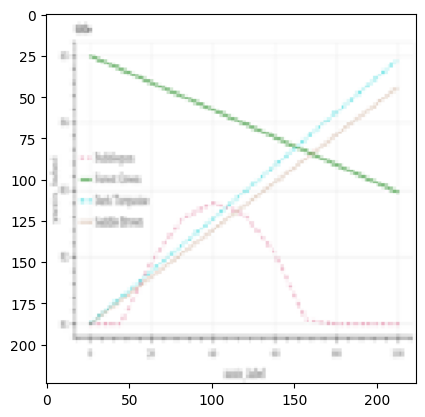

1/1 [==============================] - 0s 19ms/step
2
Prediction for 490.png: line


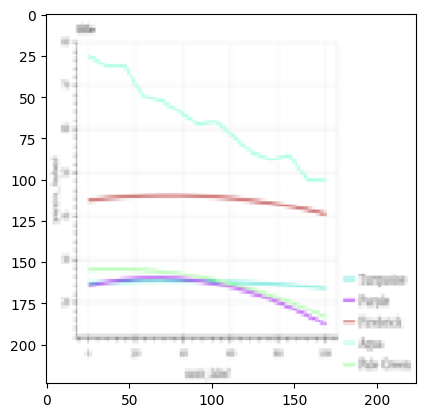

1/1 [==============================] - 0s 24ms/step
2
Prediction for 467.png: line


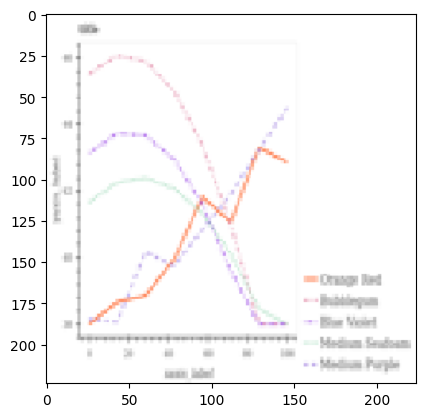

1/1 [==============================] - 0s 18ms/step
2
Prediction for 528.png: line


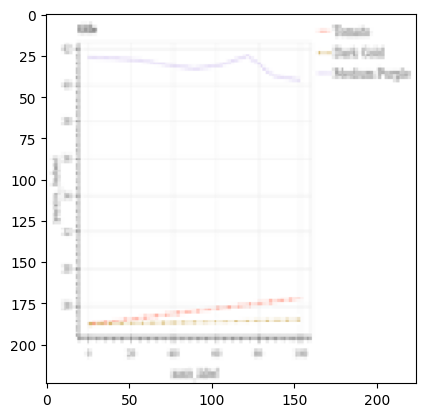

1/1 [==============================] - 0s 19ms/step
0
Prediction for 589.png: dot_line


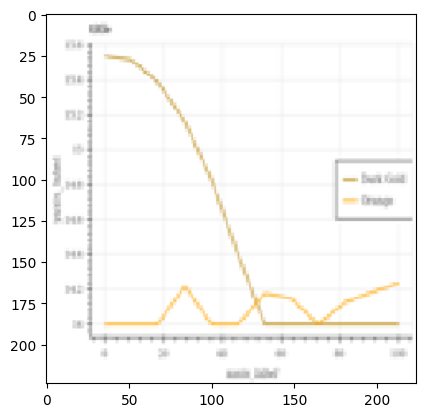

1/1 [==============================] - 0s 27ms/step
2
Prediction for 549.png: line


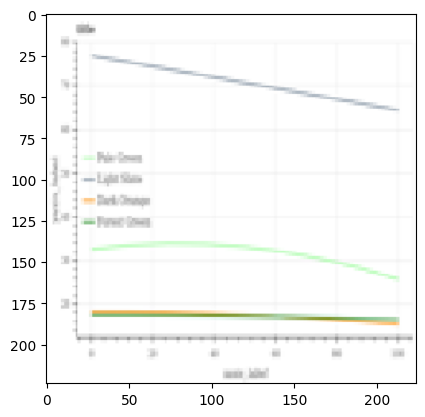

1/1 [==============================] - 0s 19ms/step
2
Prediction for 407.png: line


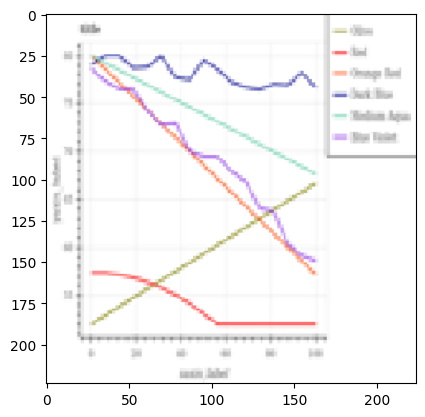

1/1 [==============================] - 0s 18ms/step
2
Prediction for 421.png: line


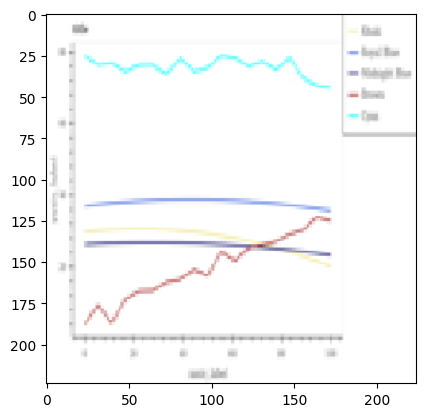

1/1 [==============================] - 0s 20ms/step
2
Prediction for 599.png: line


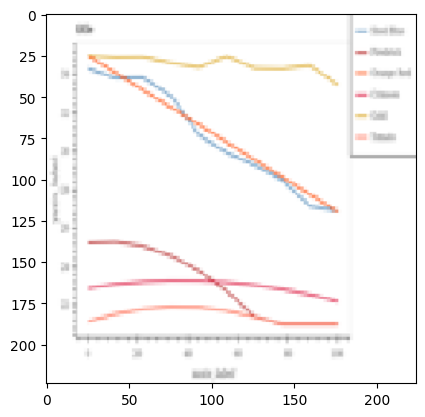

1/1 [==============================] - 0s 26ms/step
2
Prediction for 455.png: line


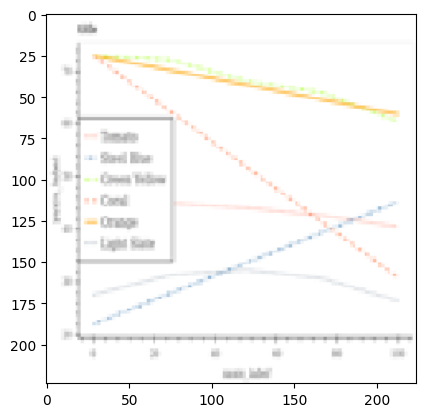

1/1 [==============================] - 0s 19ms/step
2
Prediction for 535.png: line


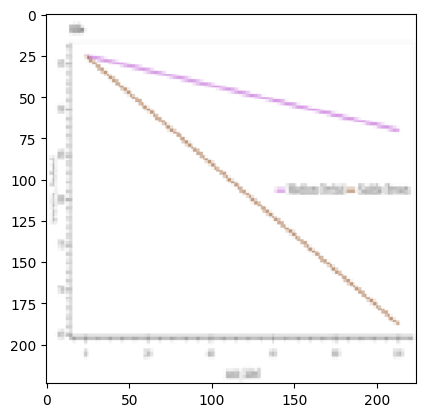

1/1 [==============================] - 0s 20ms/step
2
Prediction for 488.png: line


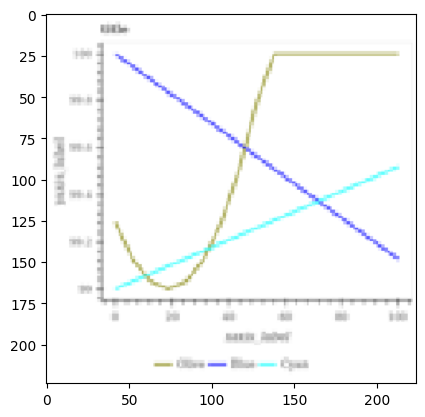

1/1 [==============================] - 0s 21ms/step
2
Prediction for 504.png: line


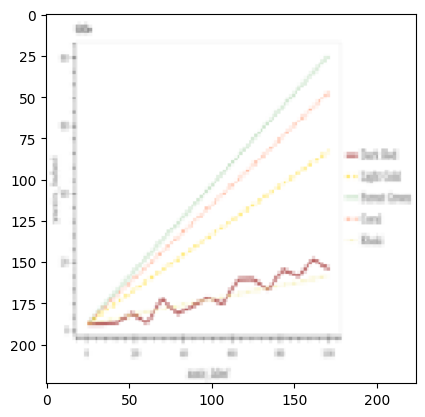

1/1 [==============================] - 0s 21ms/step
2
Prediction for 409.png: line


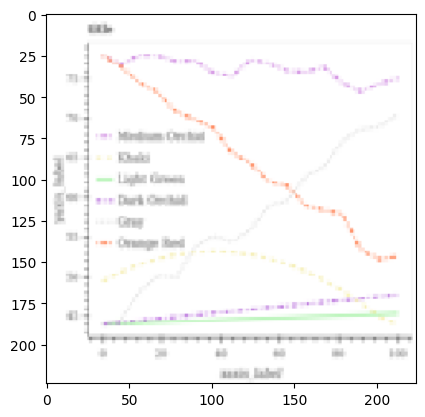

1/1 [==============================] - 0s 30ms/step
2
Prediction for 551.png: line


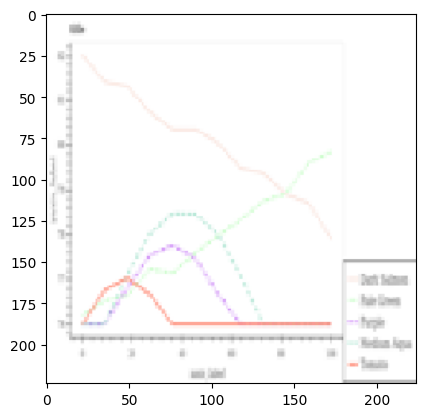

1/1 [==============================] - 0s 19ms/step
2
Prediction for 500.png: line


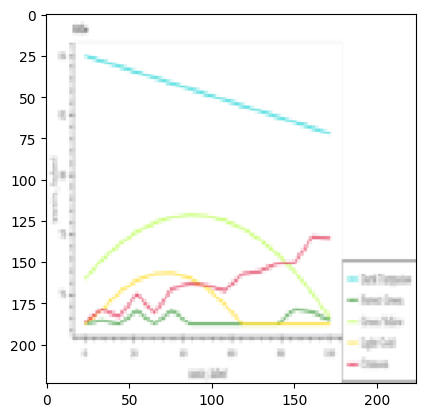

1/1 [==============================] - 0s 18ms/step
2
Prediction for 584.png: line


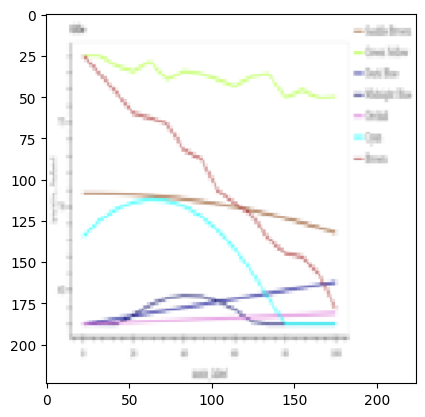

1/1 [==============================] - 0s 17ms/step
2
Prediction for 555.png: line


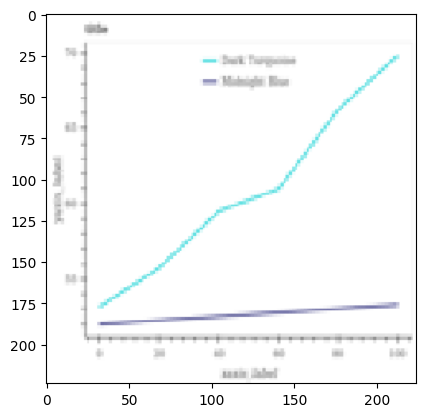

1/1 [==============================] - 0s 18ms/step
2
Prediction for 470.png: line


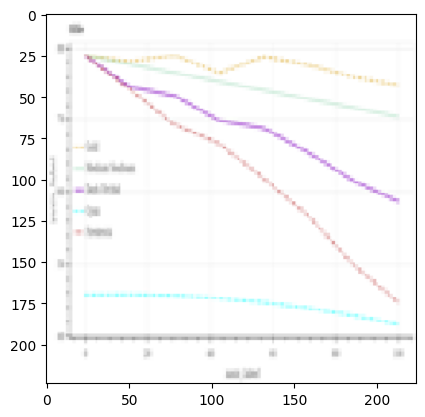

1/1 [==============================] - 0s 44ms/step
2
Prediction for 417.png: line


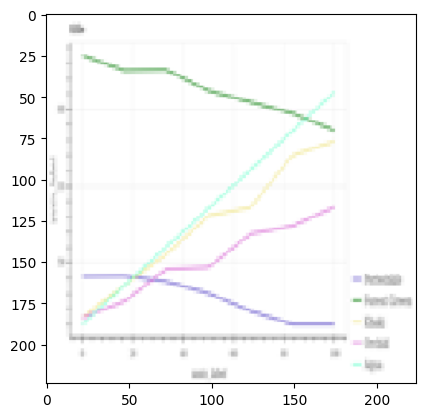

[2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]


In [ ]:
test_dir = '/content/drive/MyDrive/charts/charts/train_split/val/line'
predict_labels(test_dir, model)

**Validating all the Data inside the pie SubFolder is Predicted Correctly**

1/1 [==============================] - 0s 25ms/step
3
Prediction for 720.png: pie


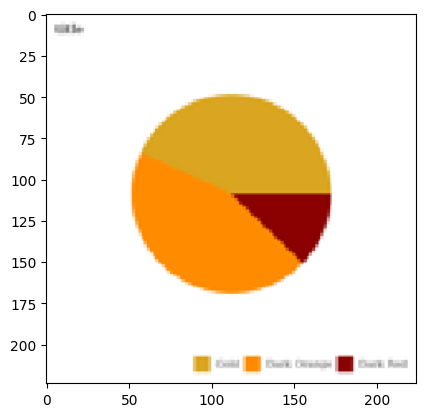

1/1 [==============================] - 0s 33ms/step
3
Prediction for 767.png: pie


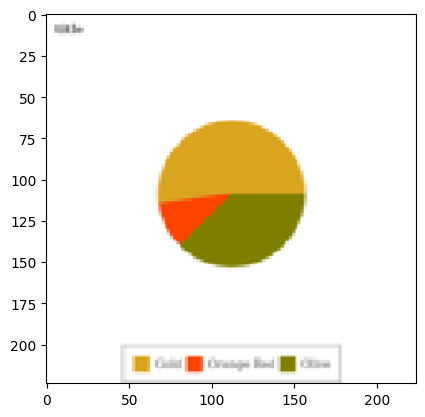

1/1 [==============================] - 0s 30ms/step
3
Prediction for 618.png: pie


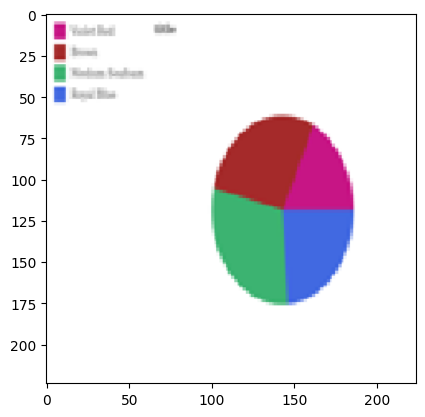

1/1 [==============================] - 0s 30ms/step
3
Prediction for 609.png: pie


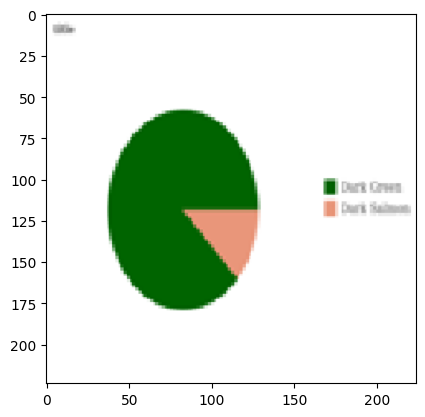

1/1 [==============================] - 0s 30ms/step
3
Prediction for 613.png: pie


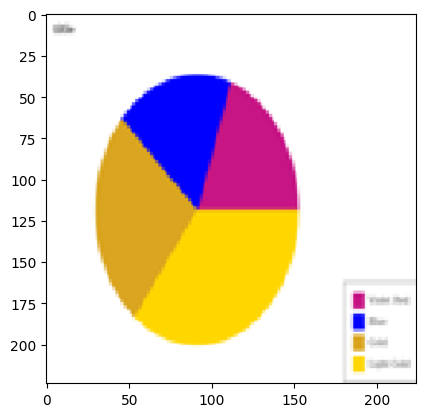

1/1 [==============================] - 0s 26ms/step
3
Prediction for 636.png: pie


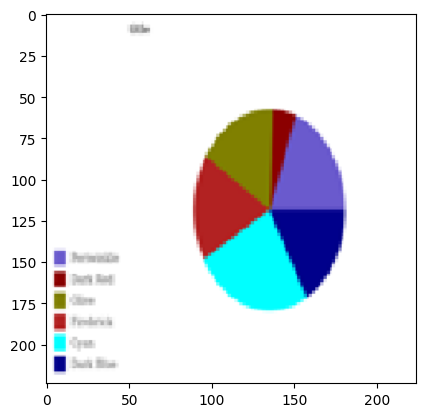

1/1 [==============================] - 0s 26ms/step
3
Prediction for 660.png: pie


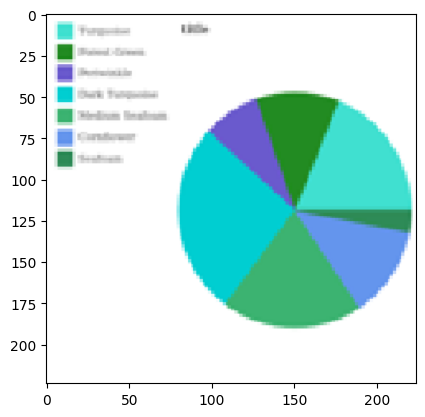

1/1 [==============================] - 0s 26ms/step
3
Prediction for 728.png: pie


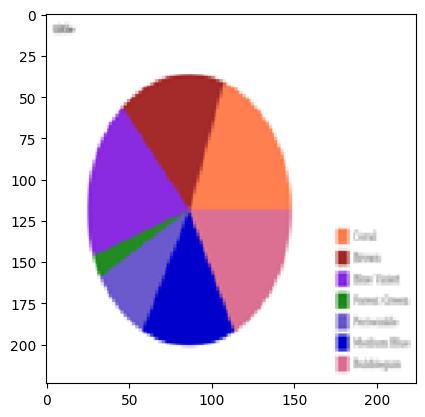

1/1 [==============================] - 0s 32ms/step
3
Prediction for 600.png: pie


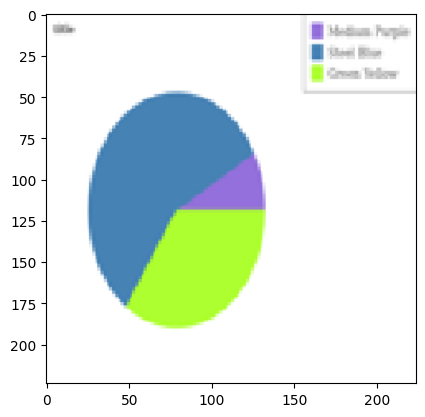

1/1 [==============================] - 0s 26ms/step
3
Prediction for 719.png: pie


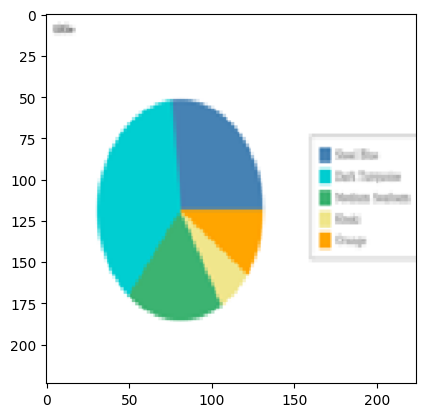

1/1 [==============================] - 0s 33ms/step
3
Prediction for 782.png: pie


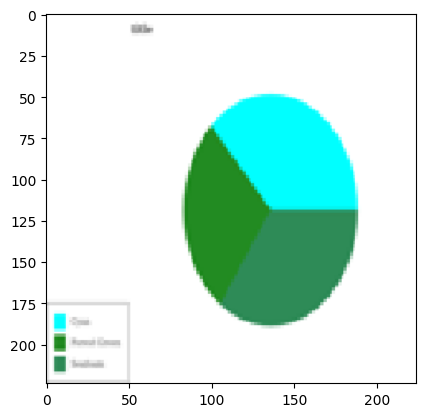

1/1 [==============================] - 0s 24ms/step
3
Prediction for 626.png: pie


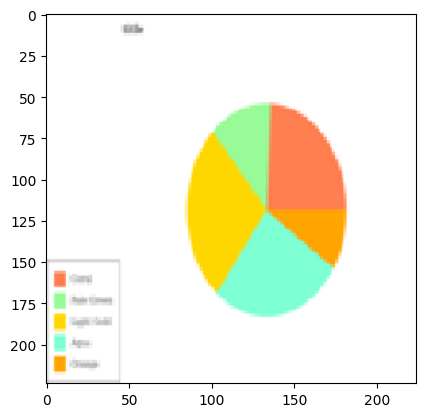

1/1 [==============================] - 0s 25ms/step
3
Prediction for 738.png: pie


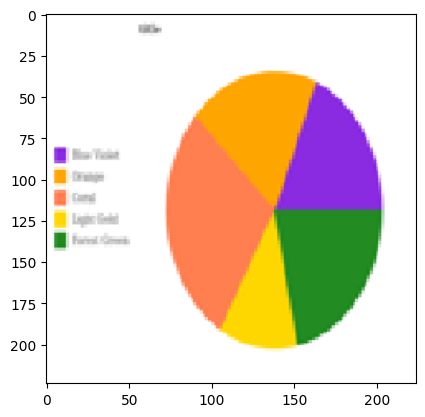

1/1 [==============================] - 0s 34ms/step
3
Prediction for 711.png: pie


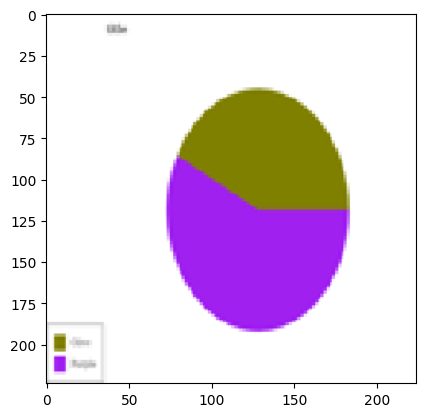

1/1 [==============================] - 0s 28ms/step
3
Prediction for 747.png: pie


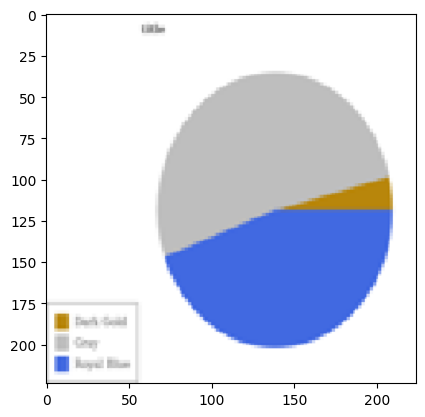

1/1 [==============================] - 0s 24ms/step
3
Prediction for 763.png: pie


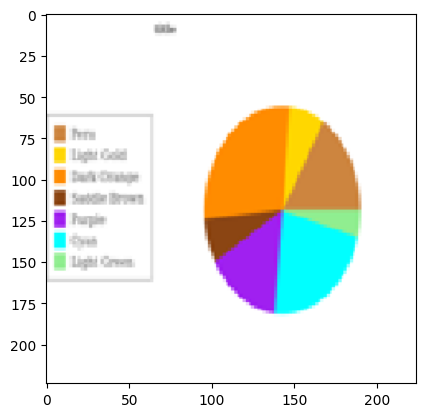

1/1 [==============================] - 0s 36ms/step
3
Prediction for 658.png: pie


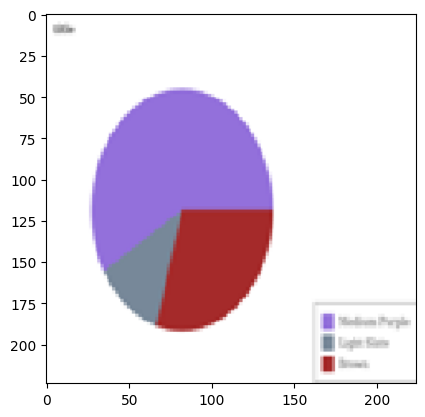

1/1 [==============================] - 0s 33ms/step
3
Prediction for 760.png: pie


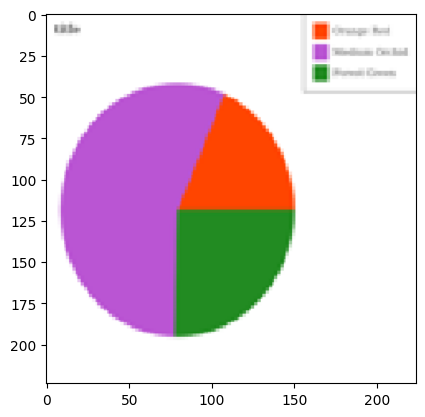

1/1 [==============================] - 0s 39ms/step
3
Prediction for 655.png: pie


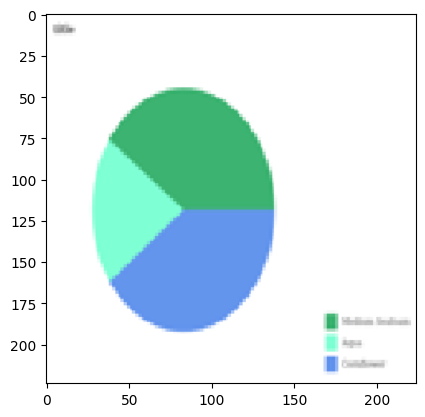

1/1 [==============================] - 0s 23ms/step
3
Prediction for 761.png: pie


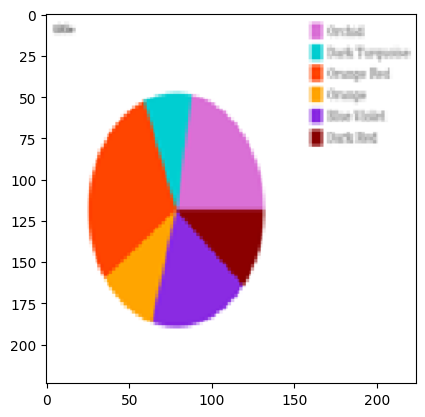

1/1 [==============================] - 0s 19ms/step
3
Prediction for 788.png: pie


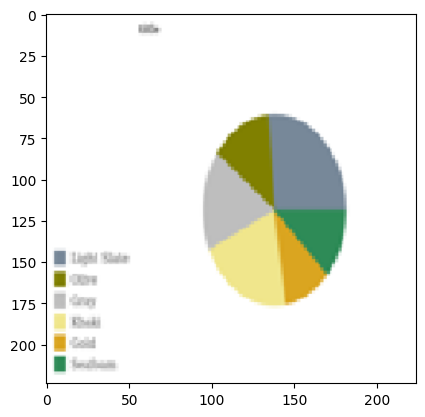

1/1 [==============================] - 0s 26ms/step
3
Prediction for 663.png: pie


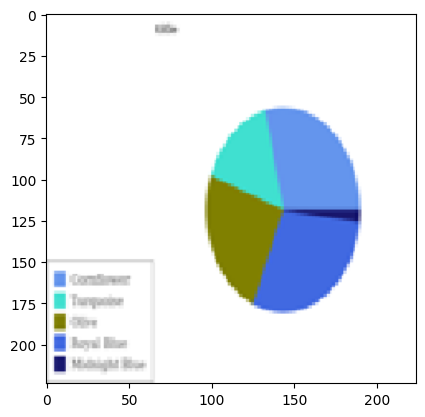

1/1 [==============================] - 0s 19ms/step
3
Prediction for 754.png: pie


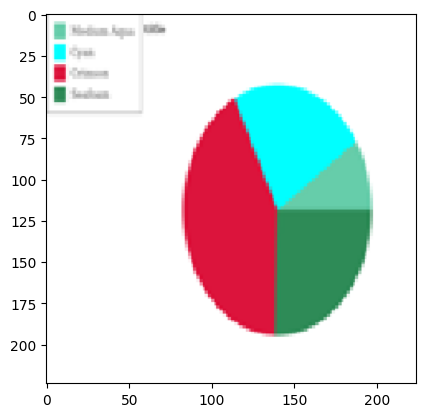

1/1 [==============================] - 0s 19ms/step
3
Prediction for 722.png: pie


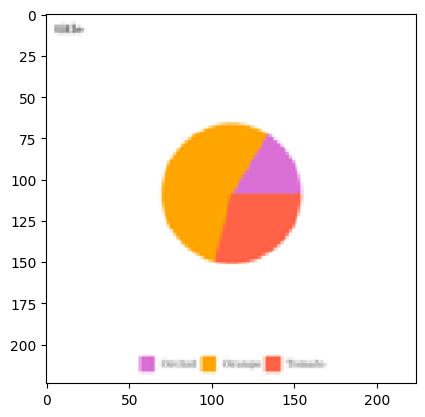

1/1 [==============================] - 0s 19ms/step
3
Prediction for 602.png: pie


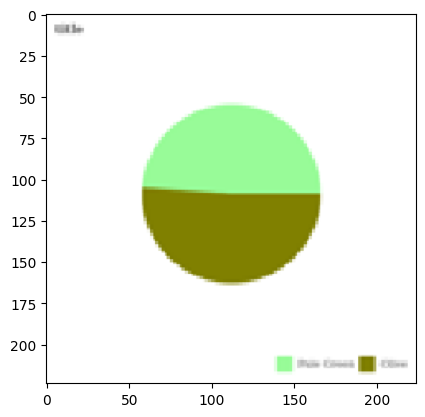

1/1 [==============================] - 0s 20ms/step
3
Prediction for 705.png: pie


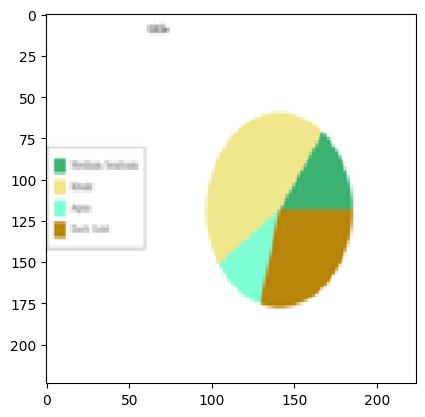

1/1 [==============================] - 0s 20ms/step
3
Prediction for 695.png: pie


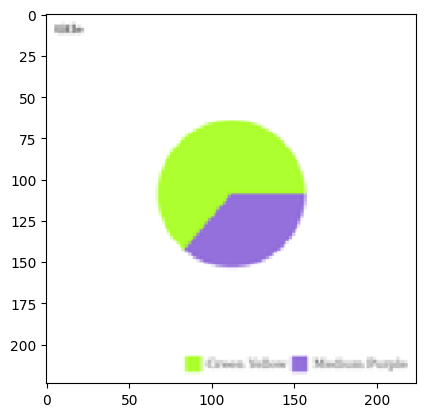

1/1 [==============================] - 0s 19ms/step
3
Prediction for 687.png: pie


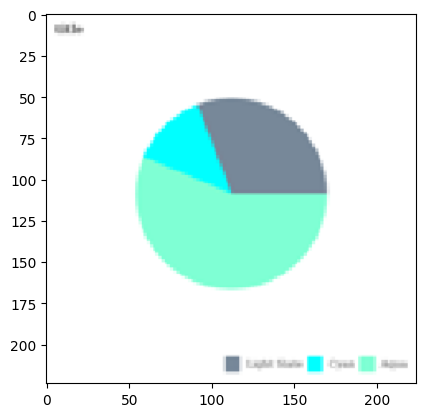

1/1 [==============================] - 0s 18ms/step
3
Prediction for 697.png: pie


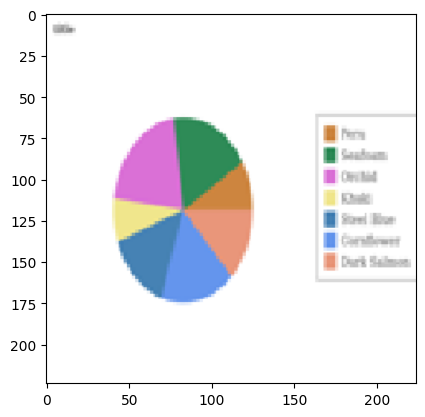

1/1 [==============================] - 0s 21ms/step
3
Prediction for 691.png: pie


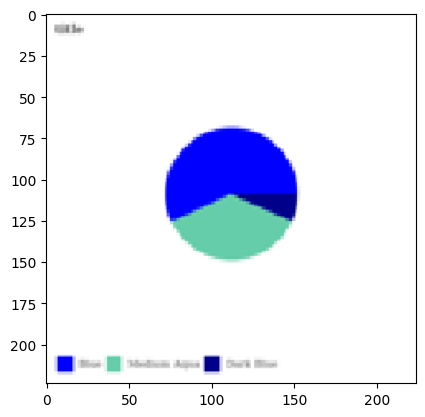

1/1 [==============================] - 0s 20ms/step
3
Prediction for 755.png: pie


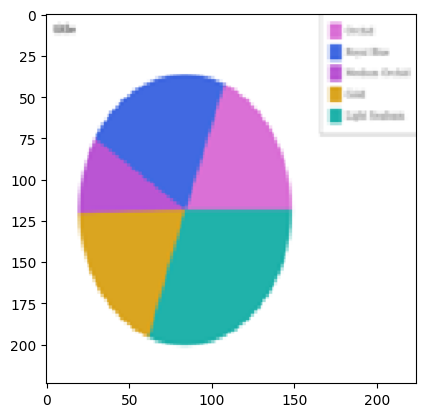

1/1 [==============================] - 0s 20ms/step
3
Prediction for 690.png: pie


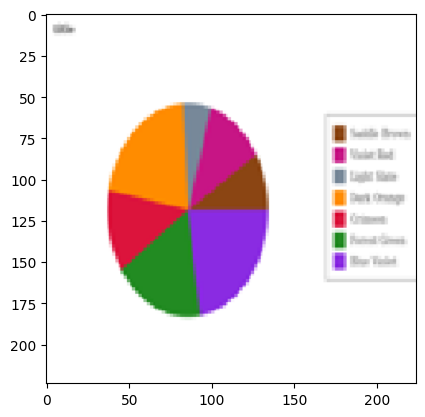

1/1 [==============================] - 0s 19ms/step
3
Prediction for 768.png: pie


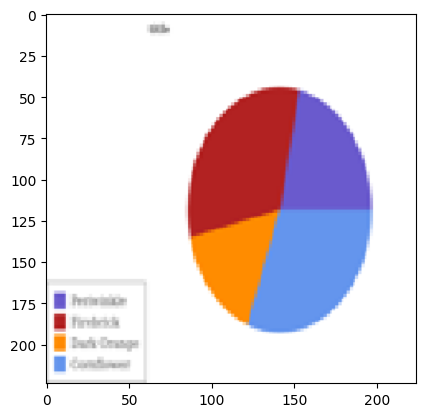

1/1 [==============================] - 0s 20ms/step
3
Prediction for 727.png: pie


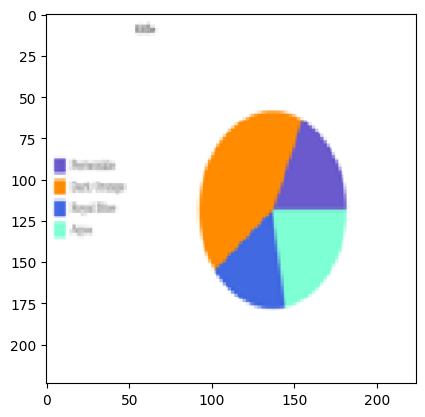

1/1 [==============================] - 0s 25ms/step
3
Prediction for 653.png: pie


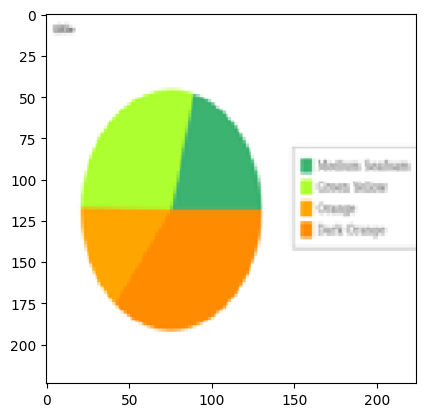

1/1 [==============================] - 0s 20ms/step
3
Prediction for 634.png: pie


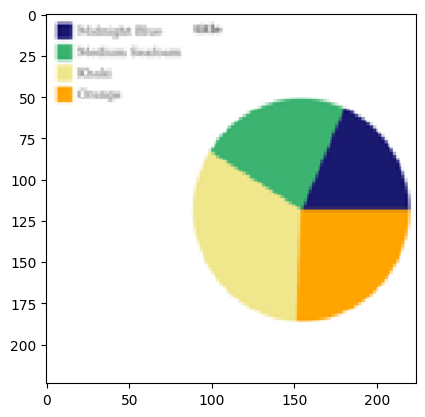

1/1 [==============================] - 0s 18ms/step
3
Prediction for 736.png: pie


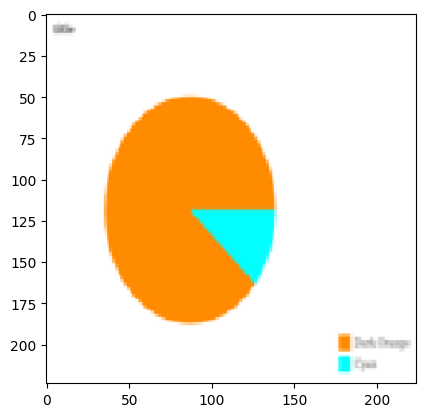

1/1 [==============================] - 0s 22ms/step
3
Prediction for 640.png: pie


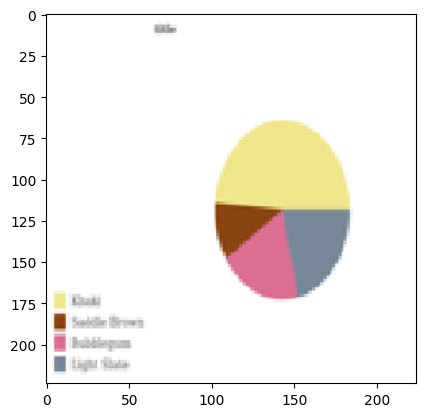

1/1 [==============================] - 0s 20ms/step
3
Prediction for 745.png: pie


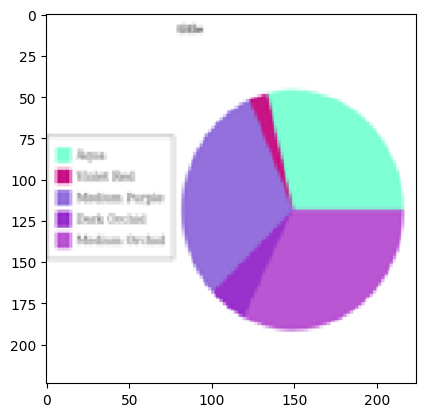

1/1 [==============================] - 0s 18ms/step
3
Prediction for 622.png: pie


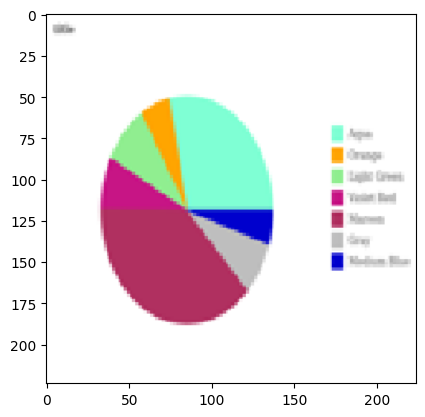

[3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3]


In [ ]:
test_dir = '/content/drive/MyDrive/charts/charts/train_split/val/pie'
predict_labels(test_dir, model)

**Validating all the Data inside the vbar_categorical SubFolder is Predicted Correctly**

1/1 [==============================] - 0s 26ms/step
4
Prediction for 130.png: vbar_categorical


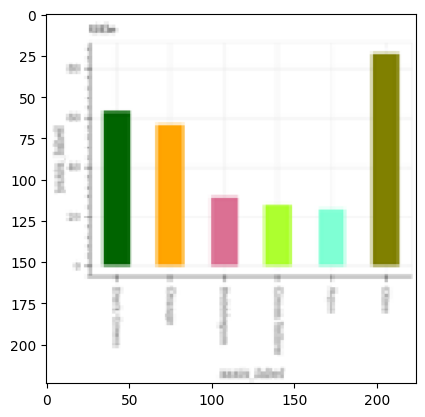

1/1 [==============================] - 0s 29ms/step
4
Prediction for 105.png: vbar_categorical


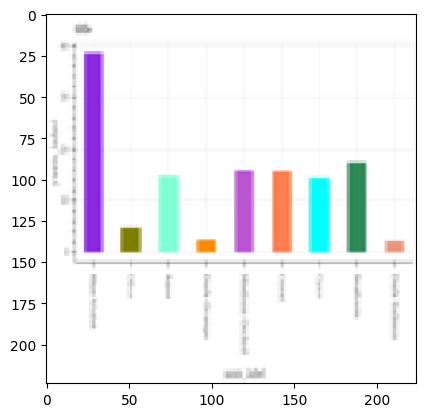

1/1 [==============================] - 0s 19ms/step
4
Prediction for 188.png: vbar_categorical


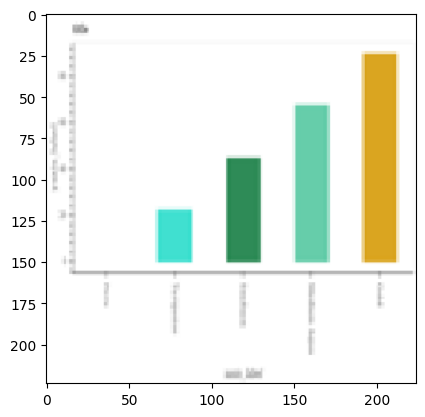

1/1 [==============================] - 0s 19ms/step
4
Prediction for 199.png: vbar_categorical


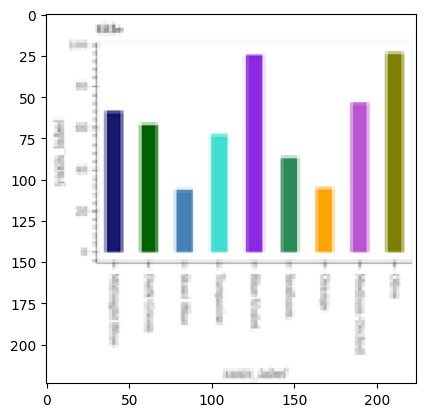

1/1 [==============================] - 0s 20ms/step
4
Prediction for 137.png: vbar_categorical


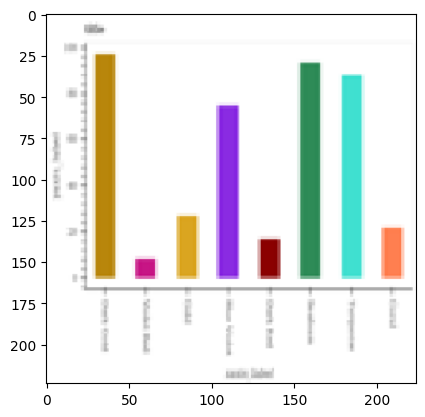

1/1 [==============================] - 0s 20ms/step
4
Prediction for 10.png: vbar_categorical


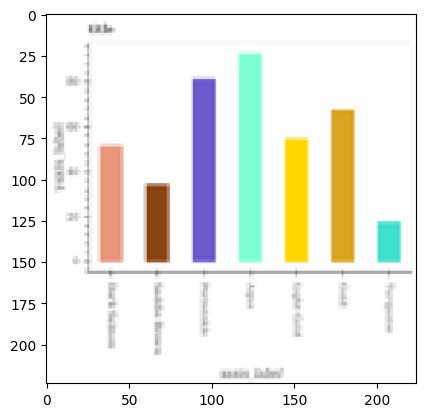

1/1 [==============================] - 0s 18ms/step
4
Prediction for 4.png: vbar_categorical


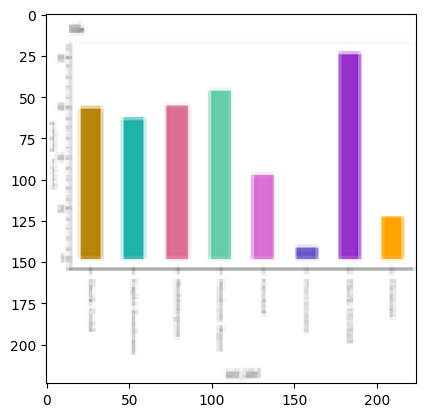

1/1 [==============================] - 0s 19ms/step
4
Prediction for 72.png: vbar_categorical


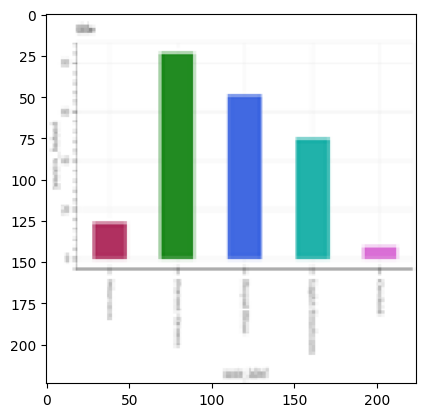

1/1 [==============================] - 0s 20ms/step
4
Prediction for 180.png: vbar_categorical


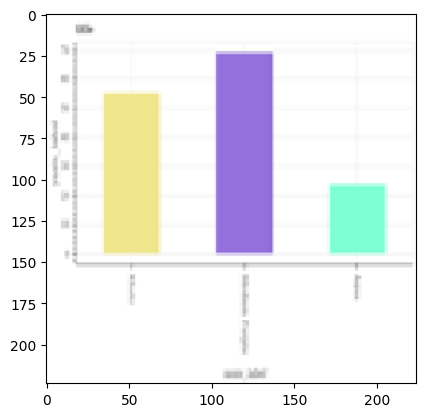

1/1 [==============================] - 0s 19ms/step
4
Prediction for 152.png: vbar_categorical


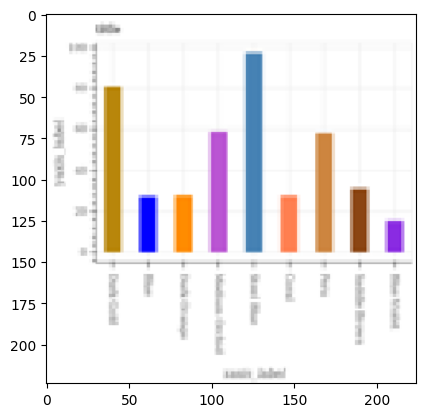

1/1 [==============================] - 0s 19ms/step
4
Prediction for 32.png: vbar_categorical


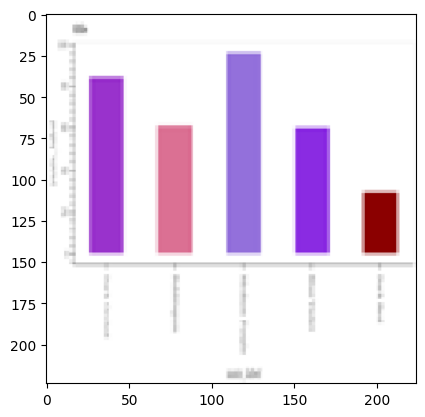

1/1 [==============================] - 0s 23ms/step
4
Prediction for 122.png: vbar_categorical


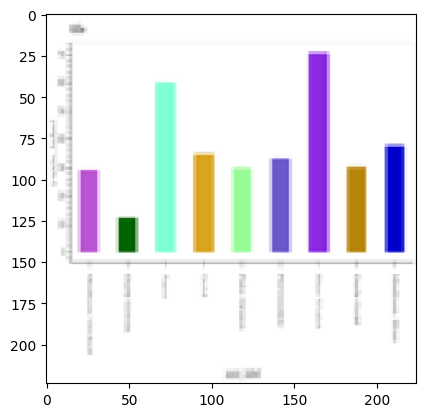

1/1 [==============================] - 0s 19ms/step
4
Prediction for 121.png: vbar_categorical


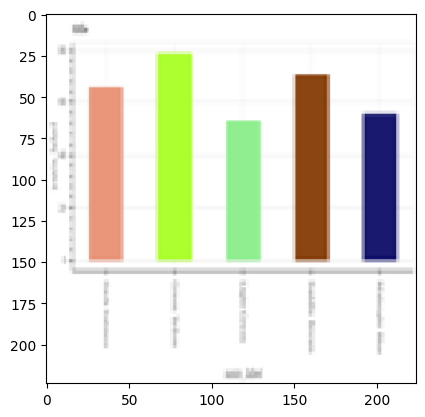

1/1 [==============================] - 0s 20ms/step
4
Prediction for 38.png: vbar_categorical


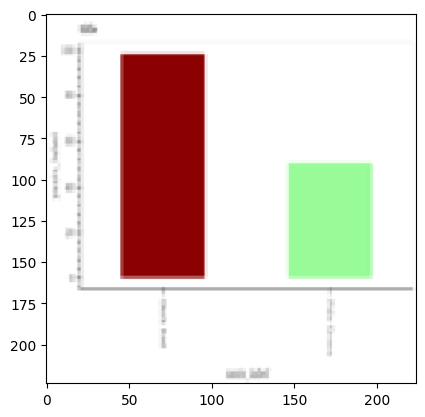

1/1 [==============================] - 0s 18ms/step
4
Prediction for 158.png: vbar_categorical


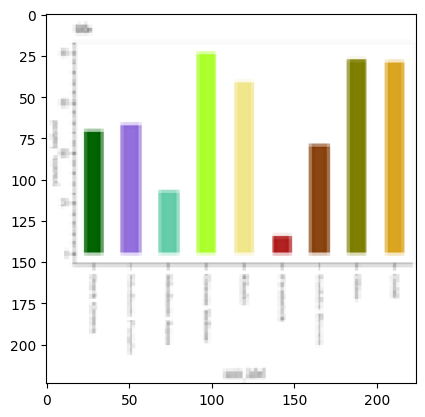

1/1 [==============================] - 0s 24ms/step
4
Prediction for 33.png: vbar_categorical


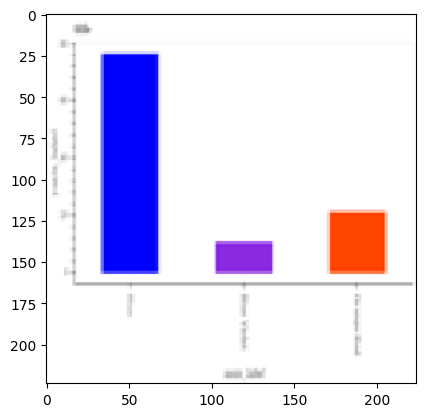

1/1 [==============================] - 0s 26ms/step
4
Prediction for 140.png: vbar_categorical


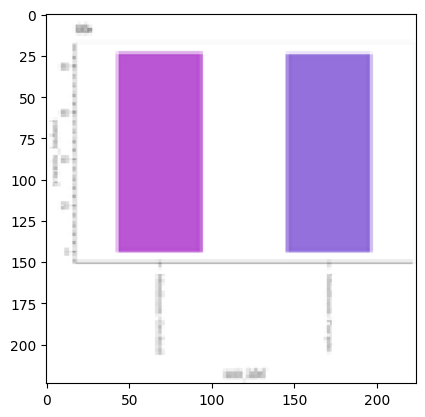

1/1 [==============================] - 0s 17ms/step
4
Prediction for 161.png: vbar_categorical


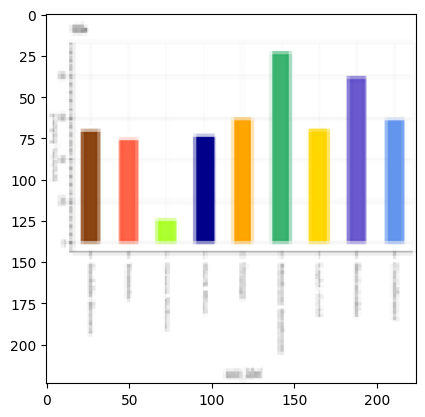

1/1 [==============================] - 0s 22ms/step
4
Prediction for 84.png: vbar_categorical


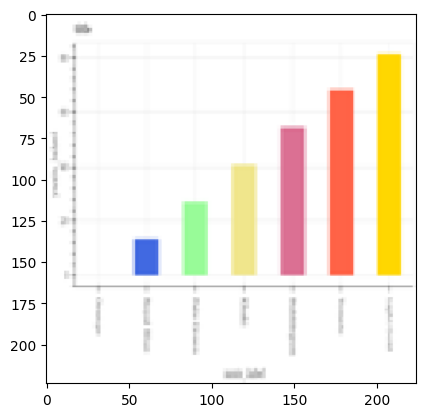

1/1 [==============================] - 0s 22ms/step
4
Prediction for 153.png: vbar_categorical


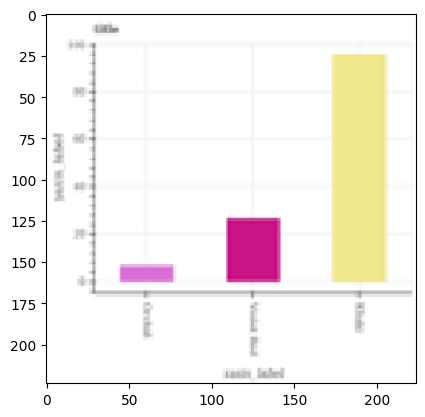

1/1 [==============================] - 0s 21ms/step
4
Prediction for 59.png: vbar_categorical


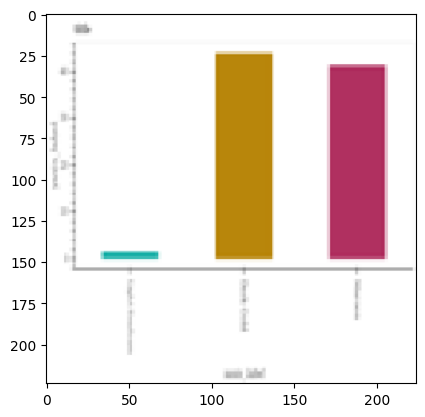

1/1 [==============================] - 0s 18ms/step
4
Prediction for 196.png: vbar_categorical


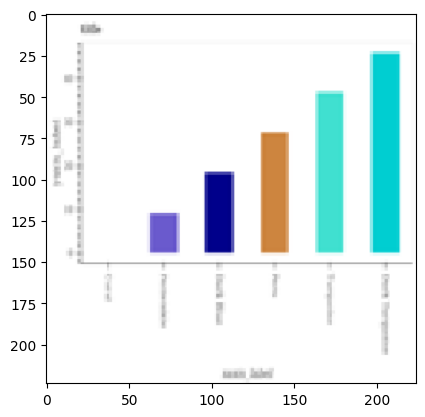

1/1 [==============================] - 0s 18ms/step
4
Prediction for 108.png: vbar_categorical


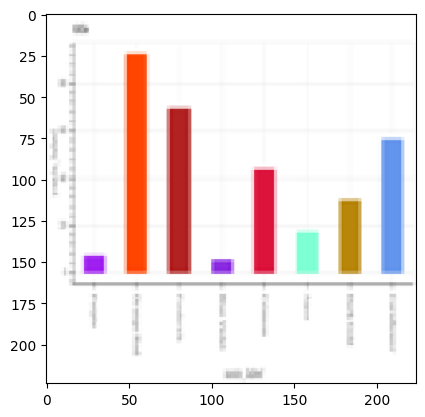

1/1 [==============================] - 0s 21ms/step
4
Prediction for 173.png: vbar_categorical


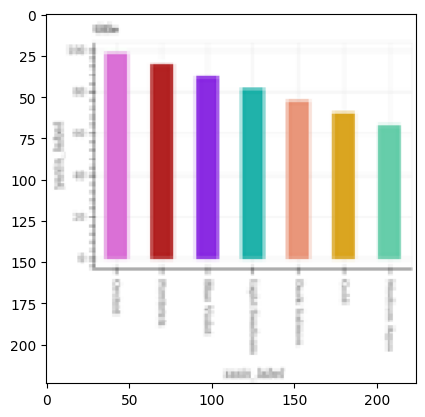

1/1 [==============================] - 0s 22ms/step
4
Prediction for 145.png: vbar_categorical


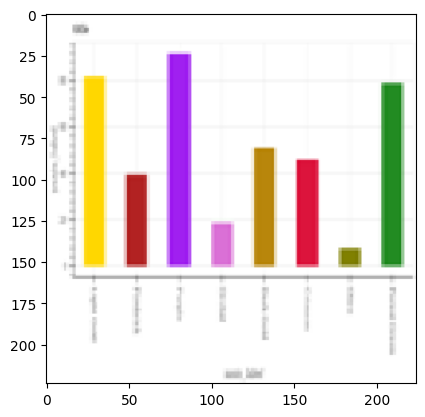

1/1 [==============================] - 0s 21ms/step
4
Prediction for 99.png: vbar_categorical


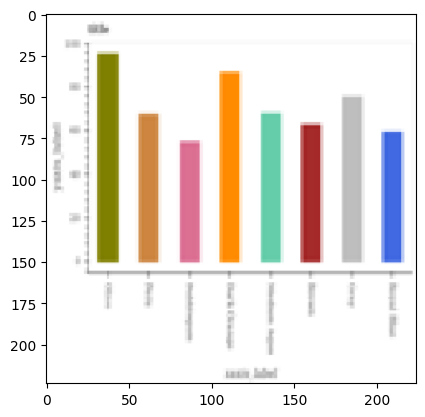

1/1 [==============================] - 0s 21ms/step
1
Prediction for 16.png: hbar_categorical


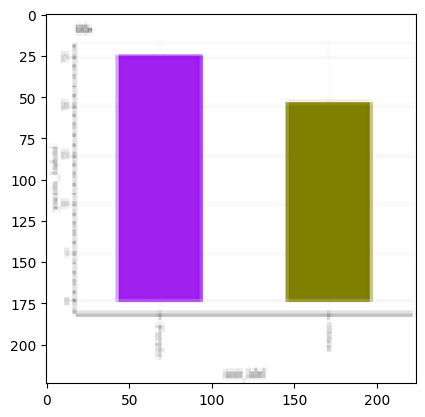

1/1 [==============================] - 0s 20ms/step
4
Prediction for 97.png: vbar_categorical


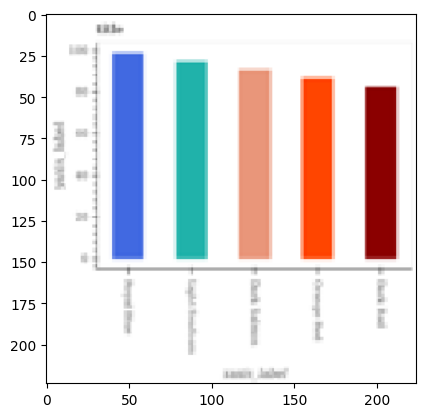

1/1 [==============================] - 0s 20ms/step
4
Prediction for 185.png: vbar_categorical


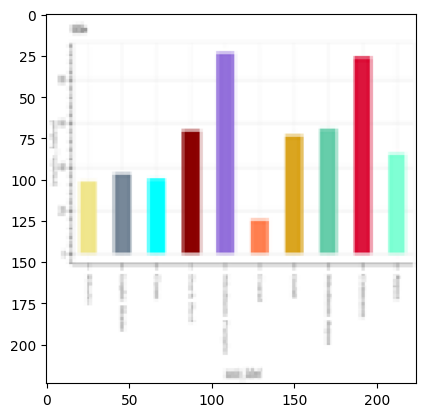

1/1 [==============================] - 0s 20ms/step
4
Prediction for 3.png: vbar_categorical


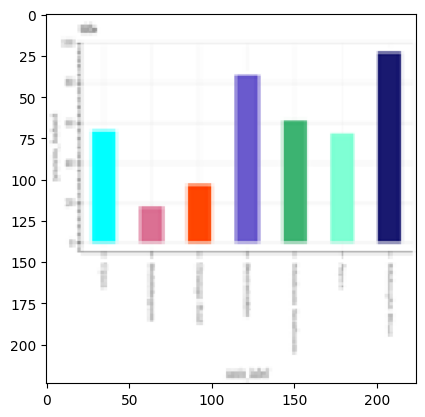

1/1 [==============================] - 0s 22ms/step
4
Prediction for 150.png: vbar_categorical


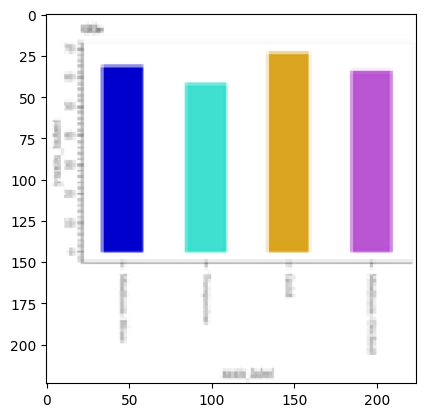

1/1 [==============================] - 0s 21ms/step
4
Prediction for 168.png: vbar_categorical


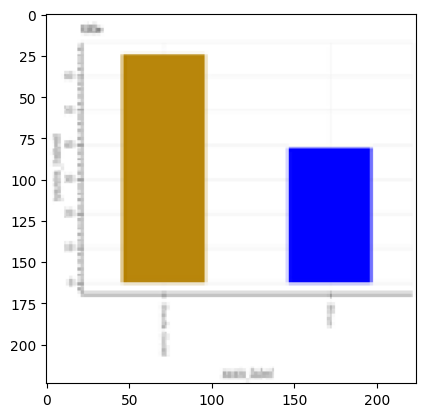

1/1 [==============================] - 0s 22ms/step
4
Prediction for 40.png: vbar_categorical


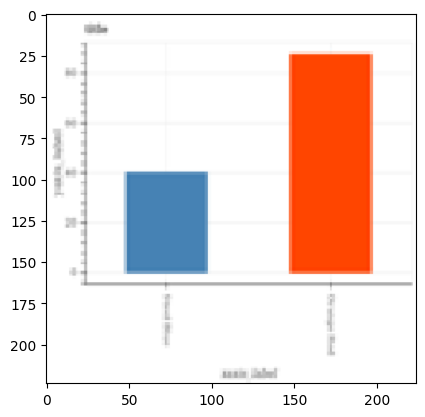

1/1 [==============================] - 0s 19ms/step
4
Prediction for 107.png: vbar_categorical


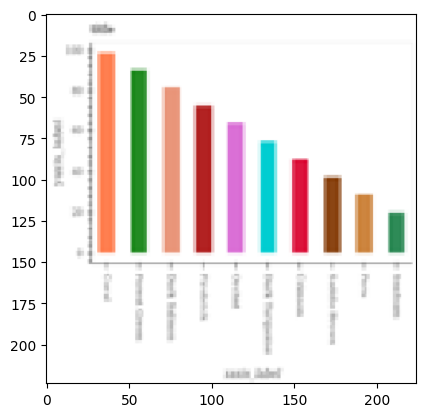

1/1 [==============================] - 0s 18ms/step
4
Prediction for 50.png: vbar_categorical


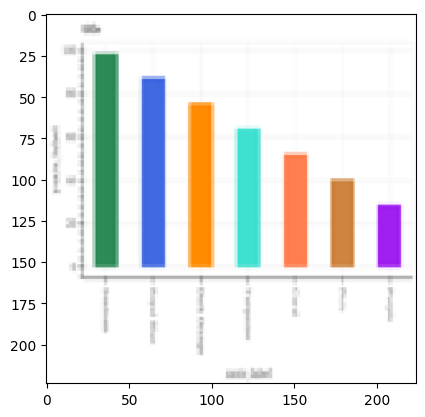

1/1 [==============================] - 0s 19ms/step
4
Prediction for 60.png: vbar_categorical


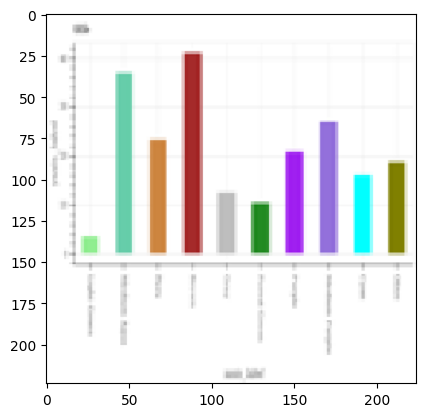

1/1 [==============================] - 0s 23ms/step
4
Prediction for 164.png: vbar_categorical


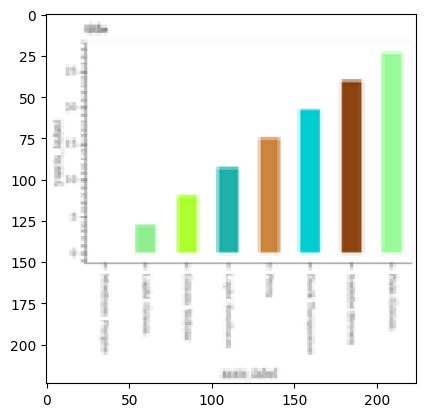

1/1 [==============================] - 0s 20ms/step
4
Prediction for 41.png: vbar_categorical


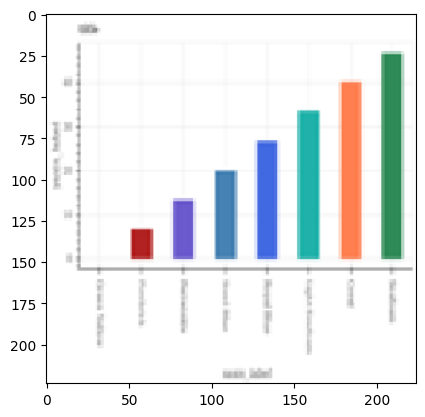

1/1 [==============================] - 0s 26ms/step
4
Prediction for 24.png: vbar_categorical


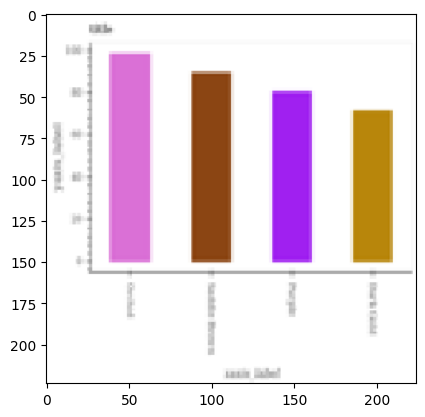

1/1 [==============================] - 0s 21ms/step
4
Prediction for 98.png: vbar_categorical


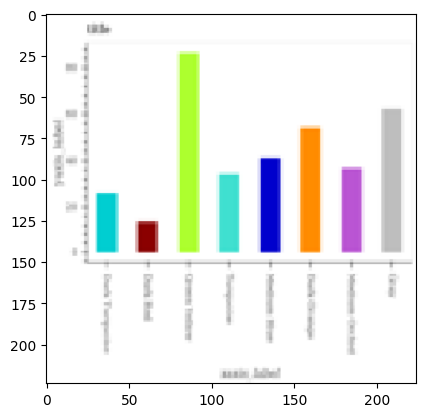

[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 1, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]


In [ ]:
test_dir = '//content/drive/MyDrive/charts/charts/train_split/val/vbar_categorical'
predict_labels(test_dir, model)

In [4]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt


conf_matrix :  

[[34, 3, 3, 0, 0], [0, 36, 0, 2, 2], [0, 0, 38, 1, 1], [0, 0, 4, 36, 0], [0, 0, 1, 4, 35]] 



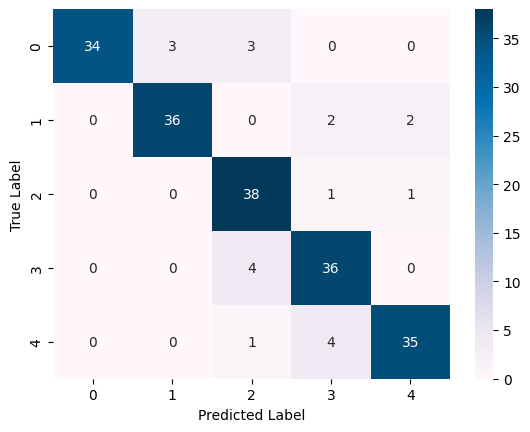

In [6]:
# Print the confusion matrix
print("conf_matrix : ","\n")
conf_matrix = [[ 34, 3,  3,  0, 0],[ 0,  36,  0, 2, 2],[ 0, 0, 38,  1,  1],[ 0,  0, 4,  36,  0],[ 0,  0, 1,  4,  35]] 
print(conf_matrix,"\n")
sns.set_palette("PuBu")
# Create the heatmap
sns.heatmap(conf_matrix, annot=True, cmap="PuBu", fmt="d")
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

**Fine Tuned the Above Model With the Help of Alex Net Architechure From Scratch**

Found 800 images belonging to 5 classes.
Found 200 images belonging to 5 classes.
Epoch 1/20
25/25 [==============================] - 8s 161ms/step - loss: 2.8284 - accuracy: 0.4850 - val_loss: 3.0416 - val_accuracy: 0.1979
Epoch 2/20
25/25 [==============================] - 3s 121ms/step - loss: 0.5752 - accuracy: 0.8062 - val_loss: 2.4056 - val_accuracy: 0.3594
Epoch 3/20
25/25 [==============================] - 3s 123ms/step - loss: 0.2390 - accuracy: 0.9275 - val_loss: 2.9754 - val_accuracy: 0.2135
Epoch 4/20
25/25 [==============================] - 3s 134ms/step - loss: 0.1205 - accuracy: 0.9638 - val_loss: 3.7930 - val_accuracy: 0.2188
Epoch 5/20
25/25 [==============================] - 3s 133ms/step - loss: 0.1059 - accuracy: 0.9762 - val_loss: 2.9467 - val_accuracy: 0.2656
Epoch 6/20
25/25 [==============================] - 3s 123ms/step - loss: 0.1207 - accuracy: 0.9663 - val_loss: 3.5458 - val_accuracy: 0.3229
Epoch 7/20
25/25 [==============================] - 3s 118ms/step 

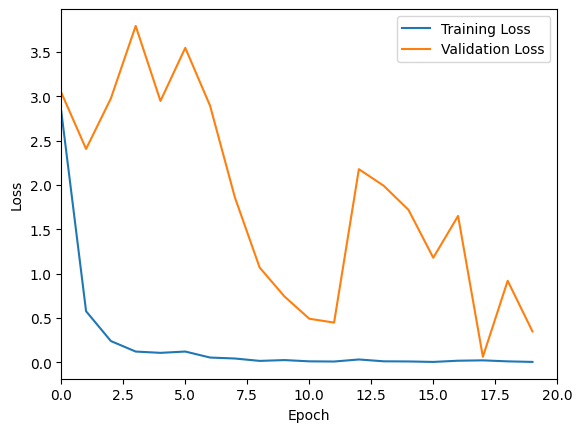

7/7 [==============================] - 1s 116ms/step - loss: 0.3339 - accuracy: 0.9200
Validation Accuracy: 0.9200000166893005


In [ ]:
import tensorflow as tf

# Define the input shape
input_shape = (227, 227, 3)

# Define the AlexNet model
model = tf.keras.Sequential([
    # Layer 1
    tf.keras.layers.Conv2D(96, kernel_size=(11, 11), strides=(4, 4), activation='relu', input_shape=input_shape),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2)),
    
    # Layer 2
    tf.keras.layers.Conv2D(256, kernel_size=(5, 5), strides=(1, 1), activation='relu', padding="same"),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2)),
    
    # Layer 3
    tf.keras.layers.Conv2D(384, kernel_size=(3, 3), strides=(1, 1), activation='relu', padding="same"),
    
    # Layer 4
    tf.keras.layers.Conv2D(384, kernel_size=(3, 3), strides=(1, 1), activation='relu', padding="same"),
    
    # Layer 5
    tf.keras.layers.Conv2D(256, kernel_size=(3, 3), strides=(1, 1), activation='relu', padding="same"),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2)),
    
    # Layer 6
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(4096, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    
    # Layer 7
    tf.keras.layers.Dense(4096, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(1000, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    
    # Layer 8
    tf.keras.layers.Dense(5, activation='softmax')
])

# Compile the model
model.compile(loss='categorical_crossentropy', optimizer='sgd', metrics=['accuracy'])

# Define the training and validation data generators
train_data_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
val_data_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

train_generator = train_data_gen.flow_from_directory('/content/drive/MyDrive/charts/charts/train_split/train',
                                                      target_size=input_shape[:2],
                                                      batch_size=32,
                                                      class_mode='categorical')

val_generator = val_data_gen.flow_from_directory('/content/drive/MyDrive/charts/charts/train_split/val',
                                                  target_size=input_shape[:2],
                                                  batch_size=32,
                                                  class_mode='categorical')

# Train the model
history = model.fit(train_generator,
                    steps_per_epoch=train_generator.samples // train_generator.batch_size,
                    epochs=20,
                    validation_data=val_generator,
                    validation_steps=val_generator.samples // val_generator.batch_size)

# Plot the training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xlim(0,20)
plt.legend()
plt.show()

# Evaluate the model on the validation set
val_loss, val_acc = model.evaluate(val_generator)
print('Validation Accuracy:', val_acc)

**Fine Tuned the Above Model With the Help of VGG16 From Scratch**

In [1]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.models import Sequential

# Define the input shape
img_size = (224, 224)

# Define the VGG16 model
model = Sequential([
    # Convolutional layers
    Conv2D(64, (3,3), activation='relu', padding='same', input_shape=img_size + (3,)),
    Conv2D(64, (3,3), activation='relu', padding='same'),
    MaxPooling2D((2,2), strides=(2,2)),
    Conv2D(128, (3,3), activation='relu', padding='same'),
    Conv2D(128, (3,3), activation='relu', padding='same'),
    MaxPooling2D((2,2), strides=(2,2)),
    Conv2D(256, (3,3), activation='relu', padding='same'),
    Conv2D(256, (3,3), activation='relu', padding='same'),
    Conv2D(256, (3,3), activation='relu', padding='same'),
    MaxPooling2D((2,2), strides=(2,2)),
    Conv2D(512, (3,3), activation='relu', padding='same'),
    Conv2D(512, (3,3), activation='relu', padding='same'),
    Conv2D(512, (3,3), activation='relu', padding='same'),
    MaxPooling2D((2,2), strides=(2,2)),
    Conv2D(512, (3,3), activation='relu', padding='same'),
    Conv2D(512, (3,3), activation='relu', padding='same'),
    Conv2D(512, (3,3), activation='relu', padding='same'),
    MaxPooling2D((2,2), strides=(2,2)),
    # Dense layers
    Flatten(),
    Dense(4096, activation='relu'),
    Dense(4096, activation='relu'),
    Dense(5, activation='softmax') # 5 classes
])


Found 800 images belonging to 5 classes.
Found 200 images belonging to 5 classes.
58889256/58889256 [==============================] - 0s 0us/step
Epoch 1/10
25/25 [==============================] - 23s 666ms/step - loss: 1.6953 - accuracy: 0.7300 - val_loss: 0.0311 - val_accuracy: 0.9950
Epoch 2/10
25/25 [==============================] - 12s 483ms/step - loss: 0.1006 - accuracy: 0.9737 - val_loss: 0.0516 - val_accuracy: 0.9900
Epoch 3/10
25/25 [==============================] - 12s 482ms/step - loss: 0.0236 - accuracy: 0.9937 - val_loss: 0.0272 - val_accuracy: 0.9950
Epoch 4/10
25/25 [==============================] - 13s 509ms/step - loss: 0.0761 - accuracy: 0.9925 - val_loss: 0.0526 - val_accuracy: 0.9950
Epoch 5/10
25/25 [==============================] - 12s 465ms/step - loss: 0.0169 - accuracy: 0.9950 - val_loss: 0.0485 - val_accuracy: 0.9950
Epoch 6/10
25/25 [==============================] - 12s 488ms/step - loss: 0.0323 - accuracy: 0.9900 - val_loss: 0.0211 - val_accuracy: 0.

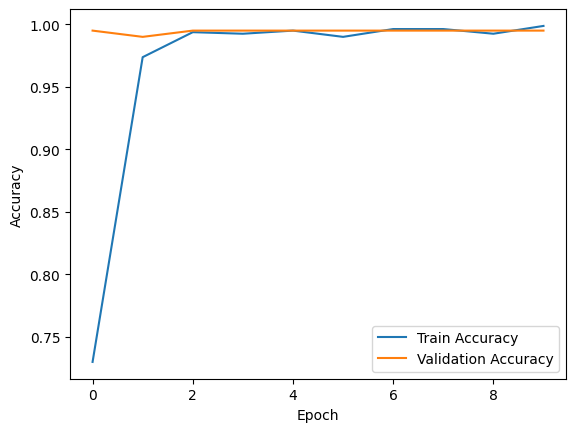

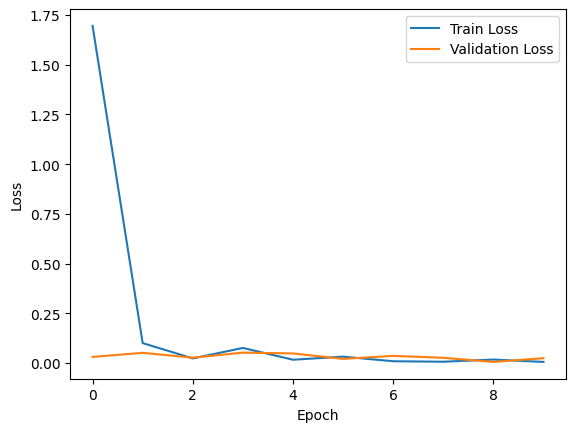

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt

# Set the image size and batch size
img_size = (224, 224)
batch_size = 32

# Set the train and test data directories
train_dir = '/content/drive/MyDrive/charts/charts/train_split/train'
test_dir = '/content/drive/MyDrive/charts/charts/train_split/val'

# Define the data generator for train and test data
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)
test_datagen = ImageDataGenerator(rescale=1./255)

# Generate the train and test data
train_data = train_datagen.flow_from_directory(
    train_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical')
test_data = test_datagen.flow_from_directory(
    test_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical')

# Define the VGG16 model
base_model = tf.keras.applications.VGG16(
    input_shape=img_size + (3,),
    include_top=False,
    weights='imagenet')

# Freeze the layers of the pre-trained model
for layer in base_model.layers:
    layer.trainable = False

# Add the classification layers on top of the pre-trained model
model = tf.keras.Sequential([
    base_model,
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1024, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(5, activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(train_data, epochs=10, validation_data=test_data)

# Evaluate the model on the test data
test_loss, test_acc = model.evaluate(test_data)
train_loss, train_acc = model.evaluate(train_data)

print('Test Loss:', test_loss)
print('Test Accuracy:', test_acc)
print('Train Loss:', train_loss)
print('Train Accuracy:', train_acc)

# Plot the loss and accuracy curves for train and test data
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


**Fine Tuned the Above Model With the Help of VGG19 From Scratch**

Found 800 images belonging to 5 classes.
Found 200 images belonging to 5 classes.
80134624/80134624 [==============================] - 0s 0us/step


Epoch 1/10
25/25 [==============================] - 14s 518ms/step - loss: 0.6672 - accuracy: 0.8438 - val_loss: 0.0035 - val_accuracy: 1.0000
Epoch 2/10
25/25 [==============================] - 13s 501ms/step - loss: 0.0515 - accuracy: 0.9875 - val_loss: 1.8803e-04 - val_accuracy: 1.0000
Epoch 3/10
25/25 [==============================] - 12s 498ms/step - loss: 0.0204 - accuracy: 0.9950 - val_loss: 0.0011 - val_accuracy: 1.0000
Epoch 4/10
25/25 [==============================] - 12s 492ms/step - loss: 0.0038 - accuracy: 0.9987 - val_loss: 8.0770e-04 - val_accuracy: 1.0000
Epoch 5/10
25/25 [==============================] - 12s 489ms/step - loss: 0.0076 - accuracy: 0.9975 - val_loss: 0.0164 - val_accuracy: 0.9948
Epoch 6/10
25/25 [==============================] - 14s 569ms/step - loss: 0.0058 - accuracy: 0.9987 - val_loss: 2.8830e-04 - val_accuracy: 1.0000
Epoch 7/10
25/25 [==============================] - 12s 498ms/step - loss: 0.0053 - accuracy: 0.9987 - val_loss: 0.0080 - val_accu

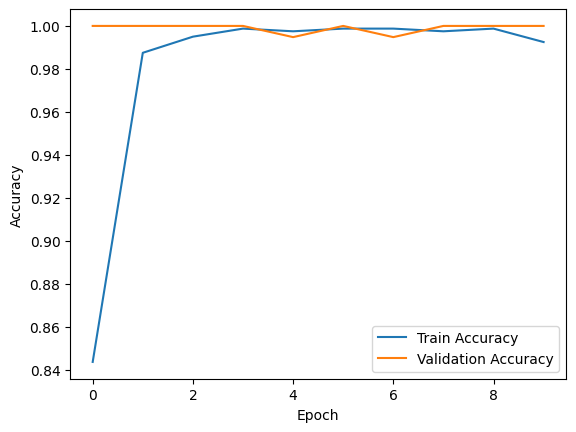

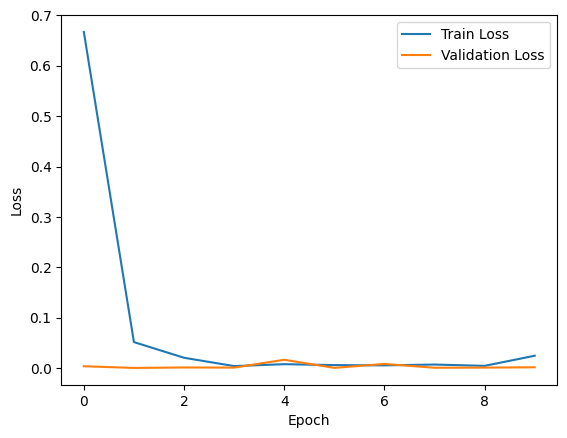

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt

# Define image size and batch size
img_size = (224, 224)
batch_size = 32

# Define directories for train and test data
train_dir = '/content/drive/MyDrive/charts/charts/train_split/train'
test_dir = '/content/drive/MyDrive/charts/charts/train_split/val'

# Create data generators for train and test data
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical'
)

# Define the VGG19 model
base_model = tf.keras.applications.VGG19(
    input_shape=img_size + (3,),
    include_top=False,
    weights='imagenet'
)

# Freeze the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Add the top layers for classification
x = tf.keras.layers.Flatten()(base_model.output)
x = tf.keras.layers.Dense(256, activation='relu')(x)
x = tf.keras.layers.Dropout(0.5)(x)
x = tf.keras.layers.Dense(5, activation='softmax')(x)

model = tf.keras.models.Model(base_model.input, x)

# Compile the model
model.compile(
    loss='categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adam(lr=0.001),
    metrics=['accuracy']
)

# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.n // batch_size,
    epochs=10,
    validation_data=test_generator,
    validation_steps=test_generator.n // batch_size
)

# Evaluate the model on test data
test_loss, test_acc = model.evaluate(test_generator)
print(f'Test Loss: {test_loss:.3f}')
print(f'Test Accuracy: {test_acc:.3f}')

# Plot the training and validation losses
train_loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(train_loss) + 1)


# Plot the loss and accuracy curves for train and test data
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


**Fine Tuned the Above Model With the Help of RESNET From Scratch**

Found 800 images belonging to 5 classes.
Found 200 images belonging to 5 classes.
94765736/94765736 [==============================] - 0s 0us/step
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/backend.py:5561: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


25/25 [==============================] - 18s 533ms/step - loss: 1.6287 - accuracy: 0.3413 - val_loss: 1.0962 - val_accuracy: 0.6450
Epoch 2/20
25/25 [==============================] - 12s 485ms/step - loss: 1.2400 - accuracy: 0.4688 - val_loss: 0.9576 - val_accuracy: 0.7000
Epoch 3/20
25/25 [==============================] - 12s 489ms/step - loss: 1.0739 - accuracy: 0.5713 - val_loss: 0.8521 - val_accuracy: 0.6750
Epoch 4/20
25/25 [==============================] - 12s 492ms/step - loss: 0.9824 - accuracy: 0.6000 - val_loss: 0.7767 - val_accuracy: 0.7650
Epoch 5/20
25/25 [==============================] - 13s 509ms/step - loss: 0.9397 - accuracy: 0.6187 - val_loss: 0.7364 - val_accuracy: 0.7750
Epoch 6/20
25/25 [==============================] - 13s 540ms/step - loss: 0.8684 - accuracy: 0.6500 - val_loss: 0.7059 - val_accuracy: 0.8600
Epoch 7/20
25/25 [==============================] - 12s 487ms/step - loss: 0.8393 - accuracy: 0.6475 - val_loss: 0.6162 - val_accuracy: 0.8400
Epoch 8/20

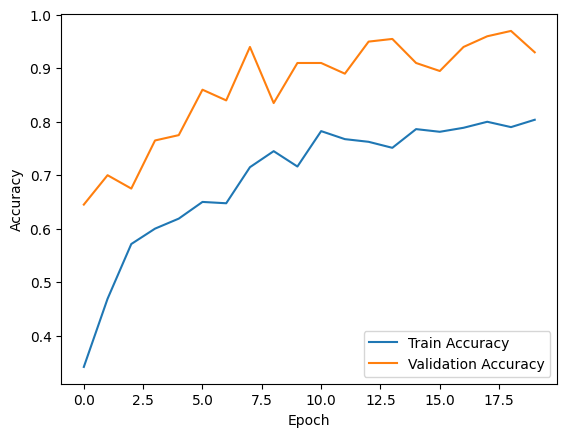

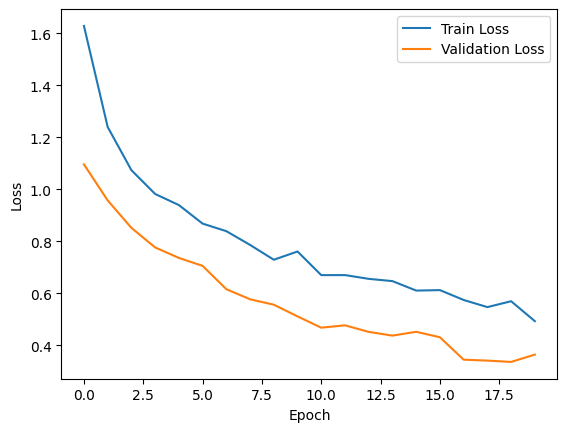

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Define the directories for the train and test data
train_dir = '/content/drive/MyDrive/charts/charts/train_split/train'
test_dir = '/content/drive/MyDrive/charts/charts/train_split/val'

# Define the batch size and number of epochs
batch_size = 32
epochs = 20

# Define the image size
img_size = (224, 224)

# Use the ImageDataGenerator class to load the data
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255
)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical'
)

# Define the ResNet50 model
base_model = tf.keras.applications.ResNet50(
    input_shape=img_size + (3,),
    include_top=False,
    weights='imagenet'
)

for layer in base_model.layers:
    layer.trainable = False

x = base_model.output
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dense(512, activation='relu')(x)
x = tf.keras.layers.Dropout(0.5)(x)
output = tf.keras.layers.Dense(train_generator.num_classes, activation='softmax')(x)

model = tf.keras.models.Model(base_model.input, output)

# Compile the model
model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)

# Fit the model
history = model.fit(
    train_generator,
    epochs=epochs,
    validation_data=test_generator
)

# Evaluate the model on the test data
test_loss, test_acc = model.evaluate(test_generator, verbose=2)

# Print the test loss and accuracy
print('Test Loss:', test_loss)
print('Test Accuracy:', test_acc)

# Plot the training and validation loss
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(epochs)

# Plot the loss and accuracy curves for train and test data
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


**Fine Tuned the Above Model With the Help of InceptionV3 model From Scratch**

Found 800 images belonging to 5 classes.
Found 200 images belonging to 5 classes.
87910968/87910968 [==============================] - 0s 0us/step
Epoch 1/10
25/25 [==============================] - 20s 568ms/step - loss: 0.6189 - accuracy: 0.8138 - val_loss: 0.4129 - val_accuracy: 0.9350
Epoch 2/10
25/25 [==============================] - 12s 475ms/step - loss: 0.1477 - accuracy: 0.9775 - val_loss: 0.2493 - val_accuracy: 0.9600
Epoch 3/10
25/25 [==============================] - 12s 484ms/step - loss: 0.1010 - accuracy: 0.9800 - val_loss: 0.1952 - val_accuracy: 0.9700
Epoch 4/10
25/25 [==============================] - 12s 485ms/step - loss: 0.0753 - accuracy: 0.9812 - val_loss: 0.1813 - val_accuracy: 0.9650
Epoch 5/10
25/25 [==============================] - 11s 439ms/step - loss: 0.0623 - accuracy: 0.9937 - val_loss: 0.1632 - val_accuracy: 0.9650
Epoch 6/10
25/25 [==============================] - 12s 460ms/step - loss: 0.0452 - accuracy: 0.9925 - val_loss: 0.1376 - val_accuracy: 0.

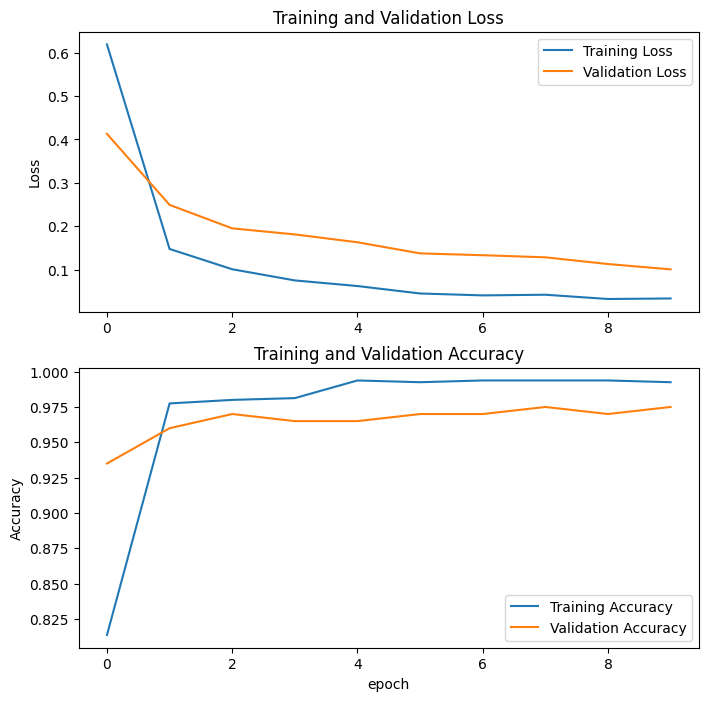

In [ ]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Set the seed for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

# Define the image size
img_size = (224, 224)

# Define the batch size
batch_size = 32

# Define the train and test data directories
train_dir = '/content/drive/MyDrive/charts/charts/train_split/train'
test_dir = '/content/drive/MyDrive/charts/charts/train_split/val'

# Define the data augmentation parameters for the train data
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Define the data augmentation parameters for the test data
test_datagen = ImageDataGenerator(rescale=1./255)

# Define the train and test data generators
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Define the GoogleNet model
base_model = tf.keras.applications.InceptionV3(
    input_shape=img_size + (3,),
    include_top=False,
    weights='imagenet'
)

# Freeze the base model layers
base_model.trainable = False

# Add the classification layers on top of the base model
model = tf.keras.models.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(5, activation='softmax')
])

# Compile the model
model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Train the model
history = model.fit(
    train_generator,
    epochs=10,
    validation_data=test_generator
)

# Evaluate the model on the test data
loss, accuracy = model.evaluate(test_generator)
print("Test Loss: {:.3f}\nTest Accuracy: {:.3f}".format(loss, accuracy))

# Plot the loss and accuracy curves for the training and validation data
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')

plt.subplot(2, 1, 2)
plt.plot(train_acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('epoch')
plt.show()


**Fine Tuned the Above Model With the Help of Xception model From Scratch**

Found 800 images belonging to 5 classes.
Found 200 images belonging to 5 classes.
83683744/83683744 [==============================] - 0s 0us/step
Epoch 1/10
25/25 [==============================] - 30s 900ms/step - loss: 0.3111 - accuracy: 0.9050 - val_loss: 0.2771 - val_accuracy: 0.9150
Epoch 2/10
25/25 [==============================] - 21s 827ms/step - loss: 0.0315 - accuracy: 0.9950 - val_loss: 0.2878 - val_accuracy: 0.9100
Epoch 3/10
25/25 [==============================] - 22s 884ms/step - loss: 0.0272 - accuracy: 0.9900 - val_loss: 0.0764 - val_accuracy: 0.9600
Epoch 4/10
25/25 [==============================] - 21s 823ms/step - loss: 0.0236 - accuracy: 0.9937 - val_loss: 0.0713 - val_accuracy: 0.9700
Epoch 5/10
25/25 [==============================] - 22s 868ms/step - loss: 0.0201 - accuracy: 0.9912 - val_loss: 0.0832 - val_accuracy: 0.9700
Epoch 6/10
25/25 [==============================] - 22s 847ms/step - loss: 0.0147 - accuracy: 0.9950 - val_loss: 0.0534 - val_accuracy: 0.

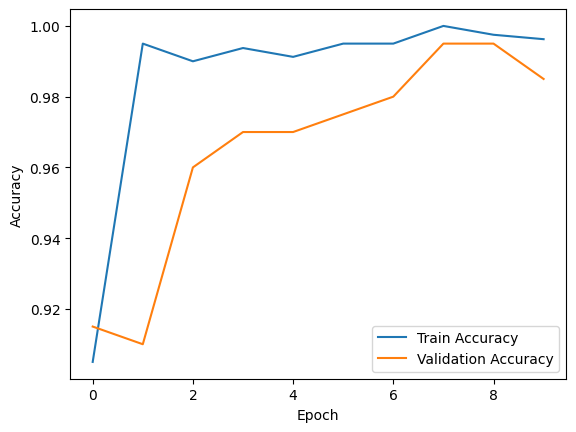

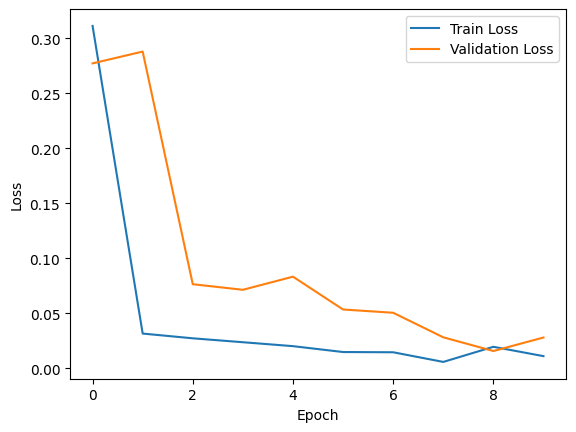

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Define the directories for the train and test data
train_dir = '/content/drive/MyDrive/charts/charts/train_split/train'
test_dir = '/content/drive/MyDrive/charts/charts/train_split/val'

# Define the batch size and number of epochs
batch_size = 32
epochs = 10

# Define the image size
img_size = (299, 299)

# Use the ImageDataGenerator class to load the data
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255
)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical'
)

# Define the Xception model
base_model = tf.keras.applications.Xception(
    input_shape=img_size + (3,),
    include_top=False,
    weights='imagenet'
)

for layer in base_model.layers:
    layer.trainable = False

x = base_model.output
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dense(512, activation='relu')(x)
x = tf.keras.layers.Dropout(0.5)(x)
output = tf.keras.layers.Dense(train_generator.num_classes, activation='softmax')(x)

model = tf.keras.models.Model(base_model.input, output)

# Compile the model
model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)

# Fit the model
history = model.fit(
    train_generator,
    epochs=epochs,
    validation_data=test_generator
)

# Evaluate the model on the test data
test_loss, test_acc = model.evaluate(test_generator, verbose=2)

# Print the test loss and accuracy
print('Test Loss:', test_loss)
print('Test Accuracy:', test_acc)

# Plot the training and validation loss
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(epochs)

# Plot the loss and accuracy curves for train and test data
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

**Fine Tuned the Above Model With the Help of RESNET From Scratch**

Found 800 images belonging to 5 classes.
Found 200 images belonging to 5 classes.
Epoch 1/10
25/25 [==============================] - 21s 641ms/step - loss: 0.0424 - accuracy: 0.9875 - val_loss: 0.0249 - val_accuracy: 0.9900
Epoch 2/10
25/25 [==============================] - 16s 643ms/step - loss: 0.0171 - accuracy: 0.9912 - val_loss: 0.0302 - val_accuracy: 0.9950
Epoch 3/10
25/25 [==============================] - 14s 552ms/step - loss: 0.0217 - accuracy: 0.9937 - val_loss: 0.0013 - val_accuracy: 1.0000
Epoch 4/10
25/25 [==============================] - 14s 550ms/step - loss: 0.0096 - accuracy: 0.9962 - val_loss: 0.0074 - val_accuracy: 0.9950
Epoch 5/10
25/25 [==============================] - 14s 545ms/step - loss: 0.0313 - accuracy: 0.9912 - val_loss: 1.8306e-04 - val_accuracy: 1.0000
Epoch 6/10
25/25 [==============================] - 14s 547ms/step - loss: 0.0383 - accuracy: 0.9900 - val_loss: 0.0038 - val_accuracy: 1.0000
Epoch 7/10
25/25 [==============================] - 14s 

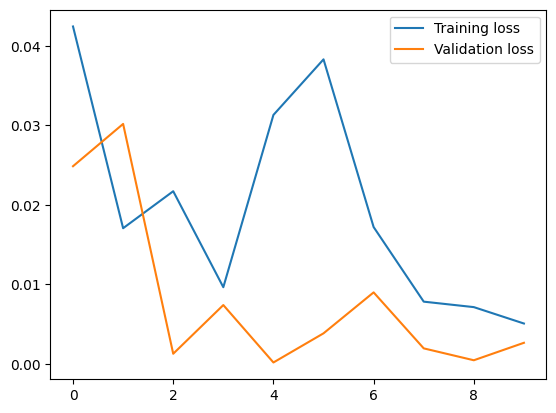

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, Add, MaxPooling2D, GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model

def conv_bn_relu(x, filters, kernel_size, strides=1):
    x = Conv2D(filters=filters, kernel_size=kernel_size, strides=strides, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    return x

def residual_block(x, filters, downsample=False):
    if downsample:
        residual = conv_bn_relu(x, filters, kernel_size=1, strides=2)
        x = conv_bn_relu(x, filters, kernel_size=1, strides=2)
    else:
        residual = x
        x = conv_bn_relu(x, filters, kernel_size=1, strides=1)

    x = conv_bn_relu(x, filters, kernel_size=3, strides=1)
    x = conv_bn_relu(x, filters*4, kernel_size=1, strides=1)
    x = Add()([x, residual])
    x = Activation('relu')(x)
    return x

def ResNet50(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    
    x = conv_bn_relu(inputs, filters=64, kernel_size=7, strides=2)
    x = MaxPooling2D(pool_size=3, strides=2, padding='same')(x)

    # First residual block
    x = residual_block(x, filters=64, downsample=False)
    x = residual_block(x, filters=64, downsample=False)
    x = residual_block(x, filters=64, downsample=False)

    # Second residual block
    x = residual_block(x, filters=128, downsample=True)
    x = residual_block(x, filters=128, downsample=False)
    x = residual_block(x, filters=128, downsample=False)
    x = residual_block(x, filters=128, downsample=False)

    # Third residual block
    x = residual_block(x, filters=256, downsample=True)
    x = residual_block(x, filters=256, downsample=False)
    x = residual_block(x, filters=256, downsample=False)
    x = residual_block(x, filters=256, downsample=False)
    x = residual_block(x, filters=256, downsample=False)
    x = residual_block(x, filters=256, downsample=False)

    # Fourth residual block
    x = residual_block(x, filters=512, downsample=True)
    x = residual_block(x, filters=512, downsample=False)
    x = residual_block(x, filters=512, downsample=False)
    
    x = GlobalAveragePooling2D()(x)
    x = Dense(units=num_classes, activation='softmax')(x)

    model = Model(inputs, x)
    return model
# Define hyperparameters
img_size = (224, 224)
batch_size = 32
epochs = 10

# Create train and test data generators
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)
train_generator = train_datagen.flow_from_directory(
    '/content/drive/MyDrive/charts/charts/train_split/train',
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical'
)
test_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)
test_generator = train_datagen.flow_from_directory(
    '/content/drive/MyDrive/charts/charts/train_split/val',
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical'
)

# Define batch size and number of epochs
batch_size = 32
epochs = 10

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(train_generator, epochs=epochs, batch_size=batch_size, validation_data=test_generator)

# Evaluate the model on the test data
test_loss, test_acc = model.evaluate(test_generator, batch_size=batch_size)
print('Test loss:', test_loss)
print('Test accuracy:', test_acc)

# Plot the training and validation loss
train_loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(train_loss, label='Training loss')
plt.plot(val_loss, label='Validation loss')
plt.legend()
plt.show()